## Setup

In [54]:
# import all
import os, errno
import netCDF4
import numpy as np
import datetime as dt
import pandas as pd
import xarray as xr
import Ngl
import calendar
import math
from scipy.interpolate import griddata
from scipy import integrate
import scipy
import scipy.stats

from subprocess import call

from pyCESM import cam_diag
import physconst
import shr_const_mod

from rhwhitepackages.readwrite import shiftlons
from rhwhitepackages.readwrite import xrayOpen, xrayMfOpen
from rhwhitepackages.stats import regressmaps
from rhwhitepackages.readwrite import getdenfilename
from rhwhitepackages.CESMmanip import *
from rhwhitepackages.plotting import *
from rhwhitepackages import CESMdiag_Rose
from rhwhitepackages.smooth_inputs import *
#from rhwhitepackages.regrid import *
import rhwhitepackages
import rhwhitepackages.smooth_inputs



import mpl_toolkits
import cartopy.crs as ccrs
import matplotlib.path as mpath
import matplotlib.ticker as mticker
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

# plotting
# import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib
from cartopy.util import add_cyclic_point
%matplotlib inline


# resize plots
matplotlib.rcParams['figure.figsize']=(20,5)
matplotlib.rcParams.update({'font.size':14})

In [2]:
Dir = '/home/disk/eos4/rachel/Projects/MHT/data/'

In [73]:
# Define functions specific to this notebook
def add_vars(infile,infileland):
    netLWsfc = infile['lwup_sfc'] - infile['lwdn_sfc']
    netSWsfc = infile['swup_sfc'] - infile['swdn_sfc']

    SurfRad = netLWsfc + netSWsfc
    TOArad = infile['netrad_toa']
    
    SHflx = infile['shflx']
    LHflx = infile['evap'] * shr_const_mod.SHR_CONST_LATVAP
    
    SnowMelt = -1.0 * infileland['smelt'] * shr_const_mod.SHR_CONST_LATICE
    SnowMelt.values = np.where(np.isnan(SnowMelt.values ),0,SnowMelt.values )    
    
    Sublim = infileland['sublim'] * shr_const_mod.SHR_CONST_LATSUB
    Sublim.values = np.where(np.isnan(Sublim.values ),0,Sublim.values )    
    
    SurfaceHeat = SurfRad + SHflx.values + LHflx.values + Sublim.values + SnowMelt.values

    NEI = SurfaceHeat + TOArad
    
    newfields = {
        'netLWsfc': netLWsfc,
        'netSWsfc': netSWsfc,
        'SurfRad': SurfRad,
        'TOArad': TOArad,
        'SHflx': SHflx,
        'LHflx': LHflx,
        'SurfaceHeat': SurfaceHeat,
        'NEI': NEI
    }
    infile = infile.assign(**newfields)
    return(infile)
    
    
    
def plot_box(exp):
    box = oceanEA[exp]['sfc_hflux_correct']
    box.plot.contour(levels = [0,1],transform = ccrs.PlateCarree(),linewidths=[2,2],colors=['k','k'])

def lat_mean(invar):
    latrad = np.deg2rad(invar.lat)
    coslat = np.cos(latrad)
    varnew = invar * coslat
    varmean = varnew.mean(dim='lat')/coslat.mean(dim='lat')
    return varmean

def lat_sum(invar):
    latrad = np.deg2rad(invar.lat)
    coslat = np.cos(latrad)
    varnew = invar * coslat
    varsum = varnew.sum(dim='lat')/coslat.sum(dim='lat')
    return varsum

def inferred_heat_transport2(energy_in, lat=None, latax=None):
    if lat is None:
        try: lat = energy_in.lat
        except:
            raise InputError('Must supply xarray with \'lat\' dimension.')
    lat_rad = np.deg2rad(lat)
    coslat = np.cos(lat_rad)
    field = coslat*energy_in
    if latax is None:
        try: latax = field.get_axis_num('lat')
        except:
            raise ValueError('Need to supply axis number for integral over latitude.')
    #  result as plain numpy array

    integral1 = integrate.cumtrapz(field, x=lat_rad, initial=0., axis=latax)
    # Now calculate in opposite direction and then flip back
    field2 = field.sel(lat=slice(None, None, -1))
    tempintegral2 = (integrate.cumtrapz(field2,np.deg2rad(field2.lat),initial=0.,axis=latax))

    # put back into xarray so we can swap the latitudes without making
    # assumptions about which dimension is latitude
    field2.values = tempintegral2
    integral2 = field2.sel(lat=slice(None,None,-1)).values

    integral = 0.5 * (integral1 + integral2)

    result = (1E-15 * 2 * np.math.pi * physconst.rearth**2 * integral)
    if isinstance(field, xr.DataArray):
        result_xarray = field.copy()
        result_xarray.values = result
        return result_xarray
    else:
        return result

    

def get_eq_tot(infile):
    fluxtot = (infile['temp_yflux_adv'] + infile['temp_yflux_gm'] + 
               infile['temp_yflux_submeso'] + infile['temp_yflux_ndiffuse'])
    # yu has values at 0N so just select this value.
    eqval = fluxtot.sel(yu_ocean=0.0)
    return(eqval)

def get_eq_thick(exp):
    fluxtot = oceanEA[exp]['dst']
    # yt has values at -0.29N and 0.29N, so linearly interpolate to get value at equator
    eqval = fluxtot.sel(yt_ocean=slice(-0.5,0.5)).mean(dim='yt_ocean')
    return(eqval)

def get_eqtotEM(infile):
    fluxtot = (infile['temp_yflux_adv'] + infile['temp_yflux_gm'] + 
               infile['temp_yflux_submeso'] + infile['temp_yflux_ndiffuse'])    # yu has values at 0N so just select this value.
    eqval = fluxtot.sel(yu_ocean=0.0)
    return(eqval)

def get_eq_thickEM(exp,EM):
    fluxtot = ocean[exp][EM]['dst']
    # yt has values at -0.29N and 0.29N, so linearly interpolate to get value at equator
    eqval = fluxtot.sel(yt_ocean=slice(-0.5,0.5)).mean(dim='yt_ocean')
    return(eqval)

def get_tot(exp):
    fluxtot = (oceanEA[exp]['temp_yflux_adv'] + oceanEA[exp]['temp_yflux_gm'] + 
               oceanEA[exp]['temp_yflux_submeso'] + oceanEA[exp]['temp_yflux_ndiffuse'])
    return(fluxtot)

def get_totEM(exp,EM):
    fluxtot = (ocean[exp][EM]['temp_yflux_adv'] + ocean[exp][EM]['temp_yflux_gm'] + 
               ocean[exp][EM]['temp_yflux_submeso'] + ocean[exp][EM]['temp_yflux_ndiffuse'])
    return(fluxtot)

def plot_single(var,vmin,vmax,const=1.0,cmap='bwr'):
    nrows=3
    matplotlib.rcParams['figure.figsize']=(20,nrows *3.0)
    matplotlib.rcParams.update({'font.size':14})

    n=1
    cenlon = 180

    for exp in exps:
        ax = plt.subplot(nrows,3,n,projection=ccrs.PlateCarree(central_longitude=cenlon)); n+=1  
        drawmap_sub(ax)
        toplot = const * (atmosEA[exp][var] - atmosEA['ctl'][var].values)

        sign1 = np.sign(atmos[exp][1][var] - atmosEA['ctl'][var].values) 
        sign2 = np.sign(atmos[exp][2][var] - atmosEA['ctl'][var].values)
        sign3 = np.sign(atmos[exp][3][var] - atmosEA['ctl'][var].values)

        mask = np.where(sign1 == sign2,1.0,np.nan)
        mask = mask * np.where(sign1 == sign3,1.0,np.nan)
        toplot.values = toplot.values * mask

        toplot.plot.contourf(vmin=vmin,vmax=vmax,levels=21,cmap=cmap,extend='both',transform = ccrs.PlateCarree())

        if exp != 'SPac_flux_2':
            plot_box(exp)
        lon_formatter = LongitudeFormatter(zero_direction_label=False,degree_symbol='')
        ax.xaxis.set_major_formatter(lon_formatter)

        plt.title(var + ' diff in ' + names[exp])
        plt.xlabel('')
        plt.ylabel('') 
        plt.xlim(-180.1,180.5)
        
def plot_diffs(var1,var2,vmin,vmax,const=1.0,cmap='BrBG'):
    nrows=3
    matplotlib.rcParams['figure.figsize']=(20,nrows *3.0)
    matplotlib.rcParams.update({'font.size':14})

    n=1
    cenlon = 180

    for exp in exps:
        ax = plt.subplot(nrows,3,n,projection=ccrs.PlateCarree(central_longitude=cenlon)); n+=1
        drawmap_sub(ax)
        toplotctl = (atmosEA['ctl'][var1] -  atmosEA['ctl'][var2])
        toplotexp = (atmosEA[exp][var1] -  atmosEA[exp][var2])

        toplot = const * (toplotexp - toplotctl)

        sign1 = np.sign((atmos[exp][1][var1] - atmos[exp][1][var2]) - toplotctl.values) 
        sign2 = np.sign((atmos[exp][2][var1] - atmos[exp][1][var2]) - toplotctl.values)
        sign3 = np.sign((atmos[exp][3][var1] - atmos[exp][1][var2]) - toplotctl.values)

        mask = np.where(sign1 == sign2,1.0,np.nan)
        mask = mask * np.where(sign1 == sign3,1.0,np.nan)
        toplot.values = toplot.values * mask

        toplot.plot.contourf(vmin=vmin,vmax=vmax,levels=21,cmap=cmap,extend='both',transform = ccrs.PlateCarree())
        if exp != 'SPac_flux_2':
            plot_box(exp)
        lon_formatter = LongitudeFormatter(zero_direction_label=False,degree_symbol='')
        ax.xaxis.set_major_formatter(lon_formatter)

        plt.title(var1 + '-' + var2 + ' diff in ' + names[exp])
        plt.xlabel('')
        plt.ylabel('')
              
def plot_ocean_creq(lon1,lon2,add):
    if lon1 == None:
        toplot_ctl = ((get_eq_tot(oceanEA['ctl'])).sum(dim='st_ocean')).sum(dim='xt_ocean')
        
    toplot_ctl = ((get_eq_tot(oceanEA['ctl'])).sel(xt_ocean=slice(lon1,lon2)).sum(dim='st_ocean')).sum(dim='xt_ocean')

    toplot = {}
    for exp in exps:
        toplot[exp] = []
        for iens in range(1,4):
            if lon1 == None:
                toplot_exp = ((get_eq_tot(ocean[exp][iens])).sum(dim='st_ocean')).sum(dim='xt_ocean')
            else:
                toplot_exp = ((get_eq_tot(ocean[exp][iens])).sel(xt_ocean=slice(lon1,lon2))
                                      .sum(dim='st_ocean')).sum(dim='xt_ocean')
                
            toplot[exp].append((toplot_exp - toplot_ctl)/1E15)

    for exp in exps:
        for iens in [0,1,2]:
            if iens == 0:
                plt.plot(add + 0.1 + expshift[exp],toplot[exp][iens],color=expcolors[exp],
                                marker=expmarkers[exp],markersize=15,
                                label=exp)
            else:
                plt.plot(add + 0.1 + expshift[exp],toplot[exp][iens],color=expcolors[exp],
                                marker=expmarkers[exp],markersize=15)                

                
                
def plot_ocean_creq_exc(lon1,lon2,add):

    toplot_ctl_all = (get_eq_tot(oceanEA['ctl'])).sum(dim='xt_ocean').sum(dim='st_ocean')
    toplot_ctl_reg = (get_eq_tot(oceanEA['ctl'])).sel(xt_ocean=slice(lon1,lon2)).sum(dim='xt_ocean').sum(dim='st_ocean')
    toplot_ctl = toplot_ctl_all - toplot_ctl_reg
    
    toplot = {}
    for exp in exps:
        toplot[exp] = []
        for iens in range(1,4):
            toplot_exp_all = (get_eq_tot(ocean[exp][iens])).sum(dim='xt_ocean').sum(dim='st_ocean')
            toplot_exp_reg = (get_eq_tot(ocean[exp][iens])).sel(xt_ocean=slice(lon1,lon2)).sum(dim='xt_ocean').sum(dim='st_ocean')
            toplot_exp = toplot_exp_all - toplot_exp_reg
            
            toplot[exp].append((toplot_exp - toplot_ctl)/1E15)

    for exp in exps:
        for iens in [0,1,2]:
            if iens == 0:
                plt.plot(add + 0.1 + expshift[exp],toplot[exp][iens],color=expcolors[exp],
                                marker=expmarkers[exp],markersize=15,
                                label=exp)
            else:
                plt.plot(add + 0.1 + expshift[exp],toplot[exp][iens],color=expcolors[exp],
                                marker=expmarkers[exp],markersize=15)   
                
                
def plot_dots_diffs(var1,var2,const,add=1.0,tropics = 0, pole=90):
    toplot = {}
    for exp in exps:
        toplot[exp] = []
        for iens in range(1,4):
            toplotctl_NH = (((atmosEA['ctl'][var1] -  atmosEA['ctl'][var2]).sel(lat=slice(tropics,pole))) * area).sum(dim='lat').sum(dim='lon')
            toplotctl_SH = (((atmosEA['ctl'][var1] -  atmosEA['ctl'][var2]).sel(lat=slice(-1.0 * pole,-1.0 * tropics))) * area).sum(dim='lat').sum(dim='lon')

            CTL_NHmSH = toplotctl_NH - toplotctl_SH

            toplotexp_NH = (((atmos[exp][iens][var1] -  atmos[exp][iens][var2]).sel(lat=slice(tropics,pole))) * area).sum(dim='lat').sum(dim='lon')
            toplotexp_SH = (((atmos[exp][iens][var1] -  atmos[exp][iens][var2]).sel(lat=slice(-1.0 * pole,-1.0 * tropics))) * area).sum(dim='lat').sum(dim='lon')

            EXP_NHmSH = toplotexp_NH - toplotexp_SH

            toplot[exp].append(const * (EXP_NHmSH - CTL_NHmSH))

    lats = {}

    for exp in exps:
        for iens in [0,1,2]:
            if iens == 0:
                plt.plot(add + 0.1 + expshift[exp],toplot[exp][iens],color=expcolors[exp],
                                marker=expmarkers[exp],markersize=15,
                                label=exp)
            else:
                plt.plot(add + 0.1 + expshift[exp],toplot[exp][iens],color=expcolors[exp],
                                marker=expmarkers[exp],markersize=15)                
            plt.xlim(0,0.6)
    plt.title(var1 + '-' + var2 )
    plt.axhline(color='k')
    
    
def plot_dots_single(var,const,add=0.0,tropics=0,pole=90):
    toplot = {}
    for exp in exps:
        toplot[exp] = []
        for iens in range(1,4):
            toplotctl_NH = (((atmosEA['ctl'][var]).sel(lat=slice(tropics,pole))) * area).sum(dim='lat').sum(dim='lon')
            toplotctl_SH = (((atmosEA['ctl'][var]).sel(lat=slice(-1.0 * pole,-1.0 * tropics))) * area).sum(dim='lat').sum(dim='lon')

            CTL_NHmSH = toplotctl_NH - toplotctl_SH

            toplotexp_NH = (((atmos[exp][iens][var]).sel(lat=slice(tropics,pole))) * area).sum(dim='lat').sum(dim='lon')
            toplotexp_SH = (((atmos[exp][iens][var]).sel(lat=slice(-1.0 * pole,-1.0 * tropics))) * area).sum(dim='lat').sum(dim='lon')

            EXP_NHmSH = toplotexp_NH - toplotexp_SH

            toplot[exp].append(const * (EXP_NHmSH - CTL_NHmSH))

    lats = {}


    for exp in exps:
        for iens in [0,1,2]:
            if iens == 0:
                plt.plot(add + 0.1 + expshift[exp],toplot[exp][iens],color=expcolors[exp],
                                marker=expmarkers[exp],markersize=15,
                                label=exp)
            else:
                plt.plot(add + 0.1 + expshift[exp],toplot[exp][iens],color=expcolors[exp],
                                marker=expmarkers[exp],markersize=15)                
            plt.xlim(0,0.6)
    plt.title(var)
    plt.axhline(color='k')  
        

In [4]:
# Set experiment colors etc
names = {}
names['NAtl_flux_11'] = 'NXAtl'
names['NPac_flux_10'] = 'NXPac'
names['SouthAtl_flux_13'] = 'SXAtl'
names['SouthPac_flux_11'] = 'SXPac'
names['SPac_flux_2'] = 'SOcn2'
names['STPac_flux_8'] = 'STPac'
names['TPac_flux_8'] = 'NTPac'

expcolors = {}
expcolors['NAtl_flux_11'] = 'r'
expcolors['NPac_flux_10'] = 'r'
expcolors['SouthAtl_flux_13'] = 'b'
expcolors['SouthPac_flux_11'] = 'b'
expcolors['SPac_flux_2'] = 'purple'
expcolors['STPac_flux_8'] = 'deepskyblue'
expcolors['TPac_flux_8'] = 'orange'

expmarkers = {}
expmarkers['NAtl_flux_11'] = '^'
expmarkers['NPac_flux_10'] = 'o'
expmarkers['SouthAtl_flux_13'] = '^'
expmarkers['SouthPac_flux_11'] = 'o'
expmarkers['SPac_flux_2'] = 'o'
expmarkers['STPac_flux_8'] = 'o'
expmarkers['TPac_flux_8'] = 'o'

expshift = {}
expshift['NAtl_flux_11'] = 0
expshift['NPac_flux_10'] = 0
expshift['SouthAtl_flux_13'] = 0.3
expshift['SouthPac_flux_11'] = 0.3
expshift['SPac_flux_2'] = 0.4
expshift['STPac_flux_8'] = 0.2
expshift['TPac_flux_8'] = 0.1

In [5]:
# Read in climatology files
atmos = {}
ocean = {}
land = {}

atmosEA = {}
oceanEA = {}
landEA = {}

exps = ['NAtl_flux_11', 'NPac_flux_10','TPac_flux_8',
        'SouthAtl_flux_13','SouthPac_flux_11','STPac_flux_8'] # 'SPac_flux_2',]

Eyears = {}
Eyears[1] = '60-99'
Eyears[2] = '65-104'
Eyears[3] = '67-106'

atmosEA['ctl'] = xrayOpen(Dir + 'ctl_coarse_1100-1300avg_atmos.nc',False).mean(dim='time')
oceanEA['ctl'] = xrayOpen(Dir + 'ctl_coarse_1100-1300avg_ocean.nc',False).mean(dim='time')
landEA['ctl'] = xrayOpen(Dir + 'ctl_coarse_1100-1300avg_land.nc',False).mean(dim='time')


for exp in exps:
    atmos[exp] = {}
    ocean[exp] = {}
    land[exp] = {}
    for EM in range(1,4):
        atmos[exp][EM] = xrayOpen(Dir + 'Clim_' + exp + '_m' + str(EM) + '_' + Eyears[EM] + '.atmos.nc',False).mean(dim='time')
        ocean[exp][EM] = xrayOpen(Dir + 'Clim_' + exp + '_m' + str(EM) + '_' + Eyears[EM] + '.ocean.nc',False).mean(dim='time')
        land[exp][EM] = xrayOpen(Dir + 'Clim_' + exp + '_m' + str(EM) + '_' + Eyears[EM] + '.land.nc',False).mean(dim='time')
         
            
    atmosEA[exp] = (1/3.0) * (atmos[exp][1] + atmos[exp][2] + atmos[exp][3])
    oceanEA[exp] = (1/3.0) * (ocean[exp][1] + ocean[exp][2] + ocean[exp][3])
    landEA[exp] = (1/3.0) * (land[exp][1] + land[exp][2] + land[exp][3])

 

In [6]:
# Read in timeseries files
oceanTS = {}

oceanTS_EA = {}

exps = ['NAtl_flux_11', 'NPac_flux_10','TPac_flux_8',
        'SouthAtl_flux_13','SouthPac_flux_11','STPac_flux_8'] # 'SPac_flux_2',]

Eyears = {}
Eyears[1] = '60-99'
Eyears[2] = '65-104'
Eyears[3] = '67-106'


for exp in exps:
    oceanTS[exp] = {}
    oceanTS_EA[exp] = {}
    for EM in range(1,4):
        oceanTS[exp][EM] = xrayOpen(Dir + 'TimeSeries_' + exp + '_m' + str(EM) + '_' + Eyears[EM] + '.ocean.nc',False)
         
            
    oceanTS_EA[exp]['temp'] = (1/3.0) * (oceanTS[exp][1]['temp'] + 
                                         oceanTS[exp][2]['temp'].values + 
                                         oceanTS[exp][3]['temp'].values)

    oceanTS_EA[exp]['rho_dzt'] = (1/3.0) * (oceanTS[exp][1]['rho_dzt'] + 
                                         oceanTS[exp][2]['rho_dzt'].values + 
                                         oceanTS[exp][3]['rho_dzt'].values)



## Calculate required fields

In [7]:
# Calculate masks and area weighting variable
mask = atmosEA['ctl'].land_mask

mask_land = mask.copy(deep=True)
mask_land.values = np.where(mask > 0.5,0.0,1.0)
mask_ocean = mask.copy(deep=True)
mask_ocean.values = np.where(mask < 0.5,0.0,1.0)

def get_area(latstart,latend,lonstart,lonend):
    dlon = lonend - lonstart
    dlonrad = dlon * (2.0 * np.pi)/360.0
    latstartrad = latstart * (2.0 * pi)/360.0
    latendrad = latend * (2.0 * pi)/360.0
    area = rearth**2 * abs(np.sin(latstartrad) - np.sin(latendrad)) * dlonrad
    return(area)

area = atmosEA['ctl']['netrad_toa'].copy(deep=True)

area.values[...] = 0.0

lonb = atmosEA['ctl']['lonb']
latb = atmosEA['ctl']['latb']

for ilat in range(0,len(area.lat)):
    for ilon in range(0,len(area.lon)):
        area[ilat,ilon] = get_area(latb[ilat],latb[ilat+1],lonb[ilon],lonb[ilon+1])


areaO = oceanEA['ctl'].area_t

In [8]:
# Add new radiation variables
for exp in exps:
    atmosEA[exp] = add_vars(atmosEA[exp],landEA[exp])
    
    for EM in range(1,4):
        atmos[exp][EM] = add_vars(atmos[exp][EM],land[exp][EM])

atmosEA['ctl'] = add_vars(atmosEA['ctl'],landEA['ctl'])


In [9]:
# Calculate Inferred Heat Transport
HT_total = {}
HT_atm = {}
HT_ocn = {}

HT_totalEN = {}
HT_atmEN = {}
HT_ocnEN = {}

AHT = {}
OHT = {}
atmFRAC = {}
dAHT = {}
dOHT = {}

exp = 'ctl'

HT_total[exp] = inferred_heat_transport2(atmosEA[exp]['TOArad'],atmosEA[exp]['TOArad'].lat)
HT_atm[exp] = inferred_heat_transport2(atmosEA[exp]['TOArad'] + atmosEA[exp]['SurfaceHeat'], atmosEA[exp]['SurfaceHeat'].lat)
HT_ocn[exp] = inferred_heat_transport2( - atmosEA[exp]['SurfaceHeat'], atmosEA[exp]['SurfaceHeat'].lat)

AHT['ctl'] = HT_atm['ctl'].sel(lat=slice(-1.7,1.7)).mean(dim='lat').mean(dim='lon').values
OHT['ctl']= HT_ocn['ctl'].sel(lat=slice(-1.7,1.7)).mean(dim='lat').mean(dim='lon').values

for exp in exps:
    dAHT[exp] = {}
    dOHT[exp] = {}
    atmFRAC[exp] = {}
    
    HT_total[exp] = inferred_heat_transport2(atmosEA[exp]['TOArad'],atmosEA[exp]['TOArad'].lat)
    HT_atm[exp] = inferred_heat_transport2(atmosEA[exp]['TOArad'] + atmosEA[exp]['SurfaceHeat'], atmosEA[exp]['SurfaceHeat'].lat)
    HT_ocn[exp] = inferred_heat_transport2( - atmosEA[exp]['SurfaceHeat'], atmosEA[exp]['SurfaceHeat'].lat)

    HT_totalEN[exp] = {}
    HT_atmEN[exp] = {}
    HT_ocnEN[exp] = {}
    
    #ocnCTL = (get_tot(exp).sum(dim='xt_ocean').sum(dim='st_ocean') - get_tot('ctl').sum(dim='xt_ocean').sum(dim='st_ocean'))
    #meanocn = ocnCTL.sel(yu_ocean=0.0).values/1E15
    
    for EN in range(1,4):

        HT_totalEN[exp][EN] = inferred_heat_transport2(atmos[exp][EN]['TOArad'],atmos[exp][EN]['TOArad'].lat)
        HT_atmEN[exp][EN] = inferred_heat_transport2(atmos[exp][EN]['TOArad'] + atmos[exp][EN]['SurfaceHeat'], atmos[exp][EN]['SurfaceHeat'].lat)
        HT_ocnEN[exp][EN] = inferred_heat_transport2( - atmos[exp][EN]['SurfaceHeat'], atmos[exp][EN]['SurfaceHeat'].lat)

        dAHT[exp][EN] = HT_atmEN[exp][EN].sel(lat=slice(-1.7,1.7)).mean(dim='lat').mean(dim='lon') - AHT['ctl']

        dOHT[exp][EN] = ((get_totEM(exp,EN) - get_tot('ctl').values).sum(dim='xt_ocean').sum(dim='st_ocean')/1E15).sel(yu_ocean=slice(-0.5,0.5)).mean(dim='yu_ocean').values

        
        atmFRAC[exp][EN] = dAHT[exp][EN]/(dAHT[exp][EN] + dOHT[exp][EN])

In [21]:
# Calculate Precip asymmetries
## Calculate PRasy
precipASY = {}

var = 'precip'
const = 86400.0

exp = 'ctl'
tocalc = 86400.0 * (atmosEA[exp][var]).mean(dim='lon')
ctlSHprecip = lat_sum(tocalc.sel(lat=slice(-20,0)))

ctlNHprecip = lat_sum(tocalc.sel(lat=slice(0,20)))

ctlPCPasy = (ctlNHprecip-ctlSHprecip).values

for exp in exps:
    precipASY[exp] = {}
    
    tocalc = 86400.0 * (atmosEA[exp][var]).mean(dim='lon')
              
    mSHprecip = lat_sum(tocalc.sel(lat=slice(-20,0)))
    mNHprecip = lat_sum(tocalc.sel(lat=slice(0,20)))
    
    temp = {}
    for EM in range(1,4):
        tocalc = 86400.0 * (atmos[exp][EM][var]).mean(dim='lon')

        SHprecip = tocalc.sel(lat=slice(-20,-0.000001)).mean(dim='lat')
        NHprecip = tocalc.sel(lat=slice(0.000001,20)).mean(dim='lat')

        precipASY[exp][EM] = (NHprecip-SHprecip).values - ctlPCPasy
        
## Calculate PR centroid

precipCENT = {}
latN = 15
latS = -15

var = 'precip'
const = 86400.0

exp = 'ctl'
tocalc = 86400.0 * (atmosEA[exp][var]).mean(dim='lon')

eqprecip = tocalc.sel(lat=slice(latS,latN))

eqpcpsum = 0
total = 0
for lat in eqprecip.lat:
    eqpcpsum += eqprecip.sel(lat=lat) * eqprecip.lat.sel(lat=lat)
    total += eqprecip.sel(lat=lat)
    
precipCENT['ctl'] = (eqpcpsum/total).values

for exp in exps:
    precipCENT[exp] = {}
    
    tocalc = 86400.0 * (atmosEA[exp][var]).mean(dim='lon')
    eqprecip = tocalc.sel(lat=slice(latS,latN))
    eqpcpsum = 0
    total = 0
    for lat in eqprecip.lat:
        eqpcpsum += eqprecip.sel(lat=lat) * eqprecip.lat.sel(lat=lat)
        total += eqprecip.sel(lat=lat)

    mcent = (eqpcpsum/total).values

    temp = {}
    for EM in range(1,4):
        tocalc = 86400.0 * (atmos[exp][EM][var]).mean(dim='lon')
        eqprecip = tocalc.sel(lat=slice(latS,latN))
        
        eqpcpsum = 0
        total = 0
        for lat in eqprecip.lat:
            eqpcpsum += eqprecip.sel(lat=lat) * eqprecip.lat.sel(lat=lat)
            total += eqprecip.sel(lat=lat)

        precipCENT[exp][EM] = (eqpcpsum/total).values - precipCENT['ctl']
        

## Main Figures

### Figure 1

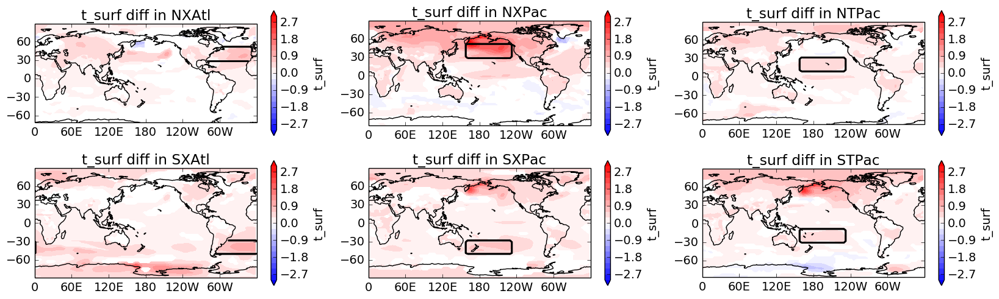

In [74]:
# Figure 1. Surface temperature changes
vmin=-3;vmax=3
plot_single('t_surf',vmin,vmax)


### Figure 2

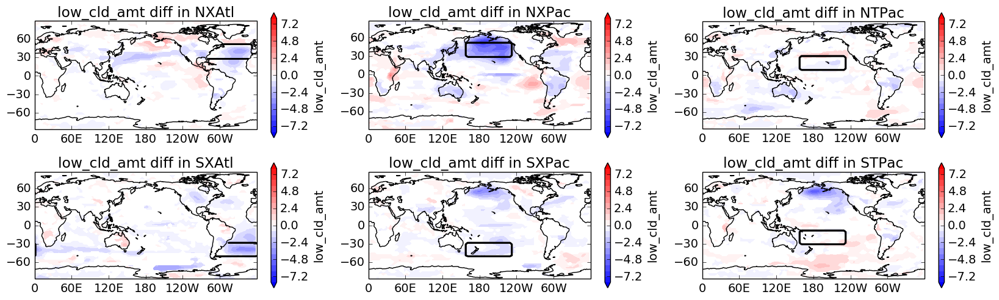

In [75]:
# Figure 2. Low cloud amount changes
vmin = -8; vmax = 8
plot_single('low_cld_amt',vmin,vmax)


### Figure 3

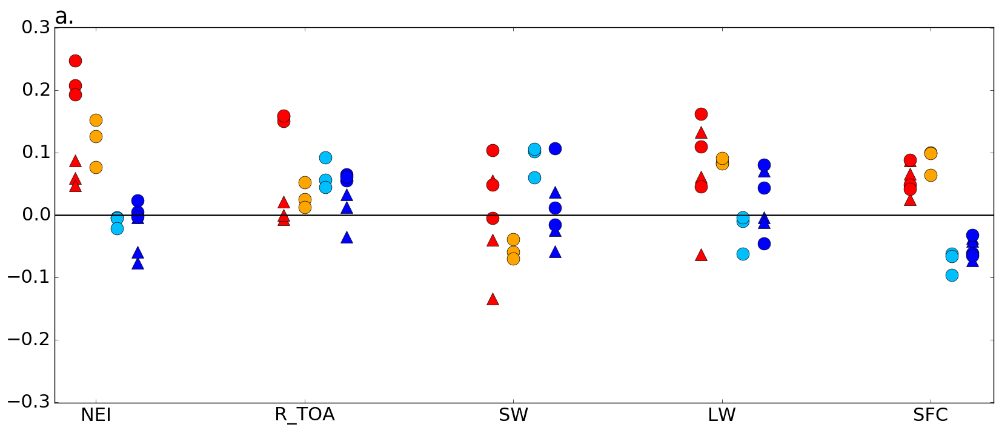

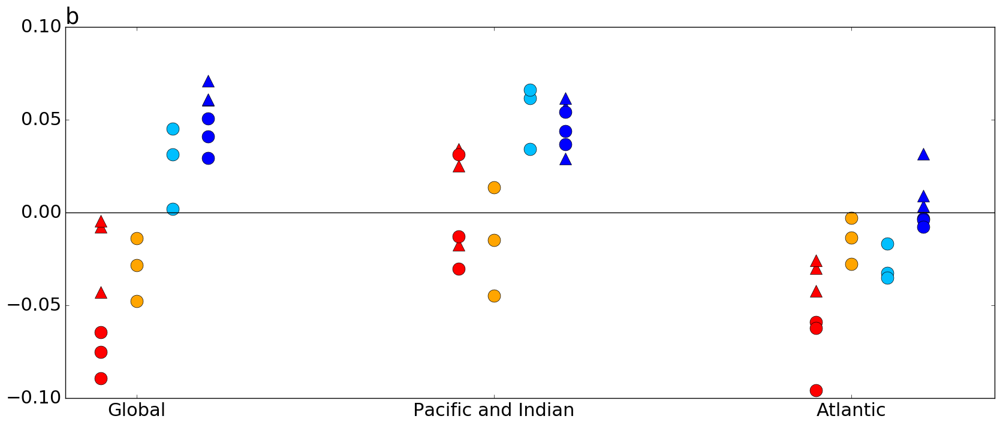

In [76]:
# Figure 3.
#Plot differences in TOA LW radiation
matplotlib.rcParams['figure.figsize']=(20,8)
matplotlib.rcParams.update({'font.size':22})
var1 = 'NEI'
const = 1E-15
plot_dots_single(var1,const,add=0,tropics = 0)


var1 = 'netrad_toa'
const = 1E-15
plot_dots_single(var1,const,add=1,tropics = 0)

var1 = 'swdn_toa'
var2 = 'swup_toa'
const = 1E-15
plot_dots_diffs(var1,var2,const,add=2,tropics = 0)

var1 = 'olr'
const = -1E-15
plot_dots_single(var1,const,add=3,tropics = 0)

var1 = 'SurfaceHeat'
const = 1E-15
plot_dots_single(var1,const,add=4,tropics = 0)


plt.xlim(0,4.5)
plt.ylim(-0.301,0.301)
plt.xticks([0.2,1.2,2.2,3.2,4.2], ['NEI','R_TOA','SW','LW','SFC'])
plt.title('')
plt.title('a.',loc='left')
plt.show()

# Plot differences in Ocean heat transport in each basin
var1 = 'temp_yflux_adv'
var2 = 'temp_yflux_gm'
var3 = 'temp_yflux_submeso'
var4 = 'temp_yflux_ndiffuse'

plot_ocean_creq(lon1=None,lon2=None,add=0.0)

#Pacific/Indian (all EXCEPT Atlantic)
lon1=-60
lon2=25

plot_ocean_creq_exc(lon1,lon2,1.0)

#Atlantic

plot_ocean_creq(lon1,lon2,2.0)
plt.xlim(0,2.6)

plt.title('')
plt.title('b',loc='left')
plt.ylim(-0.1,0.1)
plt.axhline(color='k') 
plt.xticks([0.2,1.2,2.2], ['Global','Pacific and Indian','Atlantic'])
plt.show()

### Figure 4

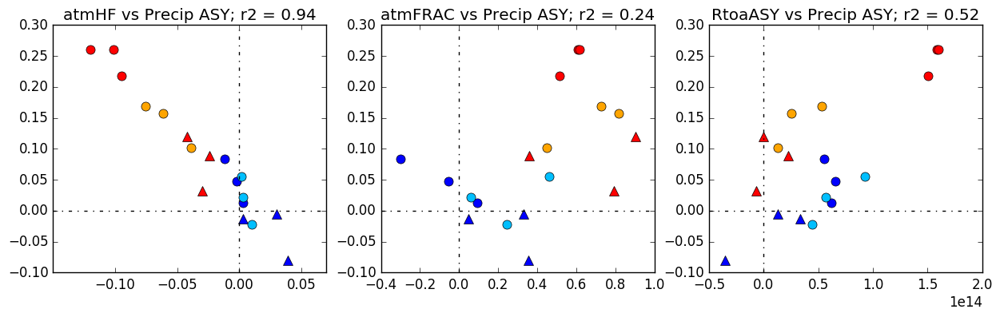

In [77]:
## Figure 4

matplotlib.rcParams['figure.figsize']=(15,4)
matplotlib.rcParams.update({'font.size':12})

plt.subplot(1,3,1)
temp = np.zeros((2,28),float); n=0
for exp in exps:
    for EN in range(1,4):
        plt.plot((dAHT[exp][EN]),precipASY[exp][EN],
                 color=expcolors[exp],marker=expmarkers[exp],markersize = 8)
        temp[0,n] = (dAHT[exp][EN])
        temp[1,n] = precipASY[exp][EN]; n+=1
slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(temp[0,0:n],temp[1,0:n])  
plt.title('atmHF vs Precip ASY; r2 = ' + "{:02.2f}".format(r_value ** 2))
plt.xlim(-0.15,0.07)
plt.axhline(linestyle='-.',color='k')
plt.axvline(linestyle='-.',color='k')

plt.subplot(1,3,2)
temp = np.zeros((2,28),float); n=0
for exp in exps:
    for EN in range(1,4):
        plt.plot(atmFRAC[exp][EN],precipASY[exp][EN],color=expcolors[exp],marker=expmarkers[exp],markersize = 8)
        temp[0,n] = atmFRAC[exp][EN]
        temp[1,n] = precipASY[exp][EN]; n+=1
slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(temp[0,0:n],temp[1,0:n])  
plt.title('atmFRAC vs Precip ASY; r2 = ' + "{:02.2f}".format(r_value ** 2))
plt.axhline(linestyle='-.',color='k')
plt.axvline(linestyle='-.',color='k')

plt.subplot(1,3,3)
temp = np.zeros((2,28),float); n=0
            
for exp in exps:
    for EN in range(1,4):
        toplotctl_NH = (((atmosEA['ctl']['netrad_toa']).sel(lat=slice(0,90))) * area).sum(dim='lat').sum(dim='lon')
        toplotctl_SH = (((atmosEA['ctl']['netrad_toa']).sel(lat=slice(-90,0))) * area).sum(dim='lat').sum(dim='lon')
        
        toplotexp_NH = (((atmos[exp][EN]['netrad_toa']).sel(lat=slice(0,90))) * area).sum(dim='lat').sum(dim='lon')
        toplotexp_SH = (((atmos[exp][EN]['netrad_toa']).sel(lat=slice(-90,0))) * area).sum(dim='lat').sum(dim='lon')
        
        raddiff = (toplotexp_NH - toplotexp_SH) - (toplotctl_NH - toplotctl_SH)
        
        plt.plot(raddiff,precipASY[exp][EN],color=expcolors[exp],marker=expmarkers[exp],markersize = 8)
        temp[0,n] = raddiff
        temp[1,n] = precipASY[exp][EN]; n+=1
slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(temp[0,0:n],temp[1,0:n])  
plt.title('RtoaASY vs Precip ASY; r2 = ' + "{:02.2f}".format(r_value ** 2))

plt.axhline(linestyle='-.',color='k')
plt.axvline(linestyle='-.',color='k')

plt.show()

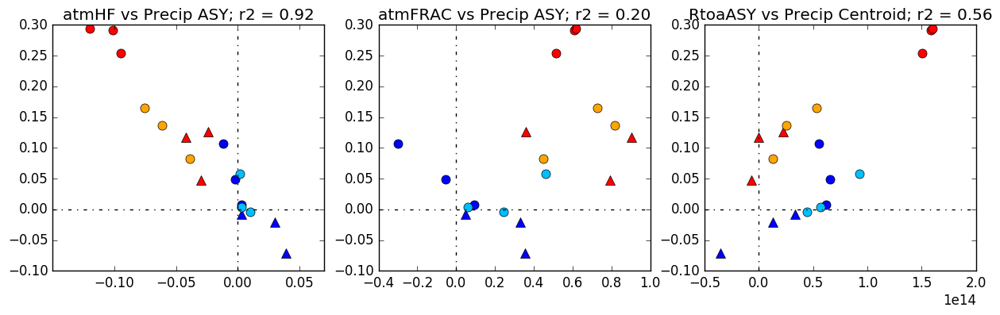

In [78]:
# Repeat figure 4 with precip centroid

matplotlib.rcParams['figure.figsize']=(15,4)
matplotlib.rcParams.update({'font.size':12})

plt.subplot(1,3,1)
temp = np.zeros((2,28),float); n=0
for exp in exps:
    for EN in range(1,4):
        plt.plot((dAHT[exp][EN]),precipCENT[exp][EN],
                 color=expcolors[exp],marker=expmarkers[exp],markersize = 8)
        temp[0,n] = (dAHT[exp][EN])
        temp[1,n] = precipCENT[exp][EN]; n+=1
slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(temp[0,0:n],temp[1,0:n])  
plt.title('atmHF vs Precip ASY; r2 = ' + "{:02.2f}".format(r_value ** 2))
plt.xlim(-0.15,0.07)
plt.axhline(linestyle='-.',color='k')
plt.axvline(linestyle='-.',color='k')

plt.subplot(1,3,2)
temp = np.zeros((2,28),float); n=0
for exp in exps:
    for EN in range(1,4):
        plt.plot(atmFRAC[exp][EN],precipCENT[exp][EN],color=expcolors[exp],marker=expmarkers[exp],markersize = 8)
        temp[0,n] = atmFRAC[exp][EN]
        temp[1,n] = precipCENT[exp][EN]; n+=1
slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(temp[0,0:n],temp[1,0:n])  
plt.title('atmFRAC vs Precip ASY; r2 = ' + "{:02.2f}".format(r_value ** 2))
plt.axhline(linestyle='-.',color='k')
plt.axvline(linestyle='-.',color='k')

plt.subplot(1,3,3)
temp = np.zeros((2,28),float); n=0
            
for exp in exps:
    for EN in range(1,4):
        toplotctl_NH = (((atmosEA['ctl']['netrad_toa']).sel(lat=slice(0,90))) * area).sum(dim='lat').sum(dim='lon')
        toplotctl_SH = (((atmosEA['ctl']['netrad_toa']).sel(lat=slice(-90,0))) * area).sum(dim='lat').sum(dim='lon')
        
        toplotexp_NH = (((atmos[exp][EN]['netrad_toa']).sel(lat=slice(0,90))) * area).sum(dim='lat').sum(dim='lon')
        toplotexp_SH = (((atmos[exp][EN]['netrad_toa']).sel(lat=slice(-90,0))) * area).sum(dim='lat').sum(dim='lon')
        
        raddiff = (toplotexp_NH - toplotexp_SH) - (toplotctl_NH - toplotctl_SH)
        
        plt.plot(raddiff,precipCENT[exp][EN],color=expcolors[exp],marker=expmarkers[exp],markersize = 8)
        temp[0,n] = raddiff
        temp[1,n] = precipCENT[exp][EN]; n+=1
slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(temp[0,0:n],temp[1,0:n])  
plt.title('RtoaASY vs Precip Centroid; r2 = ' + "{:02.2f}".format(r_value ** 2))

plt.axhline(linestyle='-.',color='k')
plt.axvline(linestyle='-.',color='k')

plt.show()

### Values for Table 1

In [120]:
# Print total cross-equatorial fluxes for Table 1:
printextra = False # True = print atm and ocn separately
for exp in exps:
    print names[exp]

    print 'total:'
    print ('max:' + "{:03.3f}".format(np.max([dAHT[exp][1] + dOHT[exp][1],
                                 dAHT[exp][2] + dOHT[exp][2],
                                 dAHT[exp][3] + dOHT[exp][3]])))           
    print ('Ensemble mean: ' + "{:03.3f}".format(np.mean([dAHT[exp][1] + dOHT[exp][1],
                                 dAHT[exp][2] + dOHT[exp][2],
                                 dAHT[exp][3] + dOHT[exp][3]])))
    print ('min:' + "{:03.3f}".format(np.min([dOHT[exp][1] + dOHT[exp][1],
                                 dAHT[exp][2] + dOHT[exp][2],
                                 dAHT[exp][3] + dOHT[exp][3]])) + '\n')



NXAtl
total:
max:-0.038
Ensemble mean: -0.051
min:-0.067

NXPac
total:
max:-0.166
Ensemble mean: -0.181
min:-0.195

NTPac
total:
max:-0.076
Ensemble mean: -0.089
min:-0.104

SXAtl
total:
max:0.110
Ensemble mean: 0.088
min:0.091

SXPac
total:
max:0.039
Ensemble mean: 0.037
min:0.032

STPac
total:
max:0.048
Ensemble mean: 0.031
min:0.004



In [112]:
# Print AHT fraction of total cross-equatorial fluxes for Table 1:
printextra = False # True = print atm and ocn separately
for exp in exps:
    print names[exp]

    print 'ratio:'
    print ('max:' + "{:03.3f}".format(np.max([atmFRAC[exp][1],atmFRAC[exp][2],atmFRAC[exp][3]])))
    print 'ensemble mean: ' + "{:03.3f}".format(np.mean([atmFRAC[exp][1],atmFRAC[exp][2],atmFRAC[exp][3]]))
    print ('min:' + "{:03.3f}".format(np.min([atmFRAC[exp][1],atmFRAC[exp][2],atmFRAC[exp][3]])) + '\n')
            

NXAtl
ratio:
max:0.905
ensemble mean: 0.687
min:0.361

NXPac
ratio:
max:0.615
ensemble mean: 0.580
min:0.515

NTPac
ratio:
max:0.817
ensemble mean: 0.665
min:0.451

SXAtl
ratio:
max:0.353
ensemble mean: 0.244
min:0.050

SXPac
ratio:
max:0.093
ensemble mean: -0.087
min:-0.301

STPac
ratio:
max:0.462
ensemble mean: 0.255
min:0.059



In [115]:
# Print TOA asymmetries for Table 1
matplotlib.rcParams['figure.figsize']=(20,8)
matplotlib.rcParams.update({'font.size':14})

RtoaASY = {}


CTL_Rtoa = (atmosEA['ctl']['netrad_toa'] * area).sum(dim='lon').sum(dim='lat').values

CTL_NH_Rtoa = (atmosEA['ctl']['netrad_toa'] * area).sum(dim='lon').sel(lat = slice(0.0,90)).sum(dim='lat').values
CTL_SH_Rtoa = (atmosEA['ctl']['netrad_toa'] * area).sum(dim='lon').sel(lat = slice(-90,-0.0)).sum(dim='lat').values

CTL_RtoaAsy = (CTL_NH_Rtoa - CTL_SH_Rtoa)

for exp in exps:
    RtoaASY[exp] = {}

    NH_Rtoa = (atmosEA[exp]['netrad_toa'] * area).sum(dim='lon').sel(lat = slice(0.0,90)).sum(dim='lat').values
    SH_Rtoa = (atmosEA[exp]['netrad_toa'] * area).sum(dim='lon').sel(lat = slice(-90,-0.0)).sum(dim='lat').values

    mdiff = ((NH_Rtoa - SH_Rtoa) - CTL_RtoaAsy )
    temp = {}
    for EN in range(1,4):
        NH_Rtoa = (atmos[exp][EN]['netrad_toa'] * area).sum(dim='lon').sel(lat = slice(0.0,90)).sum(dim='lat').values
        SH_Rtoa = (atmos[exp][EN]['netrad_toa'] * area).sum(dim='lon').sel(lat = slice(-90,-0.0)).sum(dim='lat').values

        temp[EN] = (NH_Rtoa - SH_Rtoa) - CTL_RtoaAsy
        RtoaASY[exp][EN] = temp[EN]
        
    print names[exp] + ':'
    print('max: ' + "{:03.3f}".format(np.max([temp[1],temp[2],temp[3]])/1E15))
    print('mean: ' + "{:03.3f}".format((mdiff)/1E15))
    print('min: ' + "{:03.3f}".format(np.min([temp[1],temp[2],temp[3]])/1E15) + '\n')

    

NXAtl:
max: 0.022
mean: 0.005
min: -0.007

NXPac:
max: 0.160
mean: 0.156
min: 0.151

NTPac:
max: 0.053
mean: 0.030
min: 0.013

SXAtl:
max: 0.033
mean: 0.004
min: -0.035

SXPac:
max: 0.066
mean: 0.061
min: 0.056

STPac:
max: 0.093
mean: 0.065
min: 0.045



In [114]:
## Change in OHC_AST for Table 1
for exp in exps:
    print(names[exp] + ': ')
    
    DeltaOHC_E = {}
    for EM in range(1,4):
        colHCstart = (shr_const_mod.SHR_CONST_CPSW * 
                            (oceanTS[exp][EM]['temp'].isel(time=0) * 
                             oceanTS[exp][EM]['rho_dzt'].isel(time=0)).sum(dim='st_ocean'))
        totHCstart_NH = (areaO * colHCstart).sel(yt_ocean = slice(0,90)).sum(dim=['xt_ocean','yt_ocean'])             
        totHCstart_SH = (areaO * colHCstart).sel(yt_ocean = slice(-90,0)).sum(dim=['xt_ocean','yt_ocean'])             

        colHCend = (shr_const_mod.SHR_CONST_CPSW * 
                        (oceanTS[exp][EM]['temp'].isel(time=39) * 
                         oceanTS[exp][EM]['rho_dzt'].isel(time=39)).sum(dim='st_ocean'))
        
        totHCend_NH = (areaO * colHCend).sel(yt_ocean = slice(0.001,90)).sum(dim=['xt_ocean','yt_ocean']) 
        totHCend_SH = (areaO * colHCend).sel(yt_ocean = slice(-90,-0.001)).sum(dim=['xt_ocean','yt_ocean']) 
     
        # Take difference, and divide by 40 years in seconds to get W.
        DeltaOHC = ((totHCend_NH - totHCend_SH)-(totHCstart_NH - totHCstart_SH))/(365.0 * 39.0 * 24.0 * 60.0 * 60.0)
        # Divide by 1E15 to get PW
        DeltaOHC = DeltaOHC/1E15     
        
        DeltaOHC_E[EM] = DeltaOHC
            
    print('max: ' + "{:03.3f}".format(np.max([DeltaOHC_E[1],DeltaOHC_E[2],DeltaOHC_E[3]])))  
    print('mean: ' + "{:03.3f}".format(np.mean([DeltaOHC_E[1],DeltaOHC_E[2],DeltaOHC_E[3]]))) 
    print('min: ' + "{:03.3f}".format(np.min([DeltaOHC_E[1],DeltaOHC_E[2],DeltaOHC_E[3]]))  + '\n')

NXAtl: 
max: 0.059
mean: 0.044
min: 0.035

NXPac: 
max: -0.049
mean: -0.057
min: -0.070

NTPac: 
max: 0.025
mean: 0.011
min: 0.003

SXAtl: 
max: 0.059
mean: 0.033
min: 0.006

SXPac: 
max: 0.004
mean: -0.010
min: -0.024

STPac: 
max: 0.018
mean: -0.017
min: -0.049



In [117]:
## Calculate PRasy
print 'CTL Precip Asy: ' + "{:03.3f}".format(float(ctlPCPasy))
    
for exp in exps:
    print(names[exp] + ': ')
     
    print('max: ' + "{:03.3f}".format(np.max([precipASY[exp][1],precipASY[exp][2],precipASY[exp][3]])))  
    print('mean: ' + "{:03.3f}".format(np.mean([precipASY[exp][1],precipASY[exp][2],precipASY[exp][3]])))  
    print('min: ' + "{:03.3f}".format(np.min([precipASY[exp][1],precipASY[exp][2],precipASY[exp][3]])) + '\n')

CTL Precip Asy: -0.431
NXAtl: 
max: 0.120
mean: 0.080
min: 0.032

NXPac: 
max: 0.261
mean: 0.246
min: 0.218

NTPac: 
max: 0.168
mean: 0.142
min: 0.102

SXAtl: 
max: -0.005
mean: -0.033
min: -0.081

SXPac: 
max: 0.083
mean: 0.047
min: 0.012

STPac: 
max: 0.055
mean: 0.018
min: -0.022



#### Additional hemispheric asymmetry calculations

In [130]:
## Calculate tropical TSasy
var = 't_surf'
vmin = -2; vmax = 2
const = 1.0

lonN = 15
lonS = -15
exp = 'ctl'
tocalc = const * area * (atmosEA[exp][var]).mean(dim='lon')
SH = (tocalc.sel(lat=slice(lonS,0)).sum(dim=['lat','lon'])/
            area.sel(lat=slice(lonS,0)).sum(dim=['lat','lon']))

NH = (tocalc.sel(lat=slice(0,lonN)).sum(dim=['lat','lon'])/
            area.sel(lat=slice(0,lonN)).sum(dim=['lat','lon']))
print("{:03.3f}".format(NH.values - 273.15))
print("{:03.3f}".format(SH.values - 273.15))

ctlasy = (NH-SH).values
print("{:03.3f}".format(float(ctlasy)))
    
for exp in exps:
    tocalc = const * area * (atmosEA[exp][var])
              
    SH = (tocalc.sel(lat=slice(lonS,0)).sum(dim=['lat','lon'])/
            area.sel(lat=slice(lonS,0)).sum(dim=['lat','lon']))

    NH = (tocalc.sel(lat=slice(0,lonN)).sum(dim=['lat','lon'])/
            area.sel(lat=slice(0,lonN)).sum(dim=['lat','lon']))
        
    print(exp + ': ' + "{:03.3f}".format((NH-SH).values - ctlasy))

26.699
26.569
0.130
NAtl_flux_11: 0.027
NPac_flux_10: 0.093
TPac_flux_8: 0.055
SouthAtl_flux_13: -0.013
SouthPac_flux_11: 0.018
STPac_flux_8: 0.006


In [37]:
## Calculate tropical reference height RH asy
var = 'rh_ref'
vmin = -2; vmax = 2
const = 1.0

lonN = 15
lonS = -15
exp = 'ctl'
tocalc = const * area * (atmosEA[exp][var]).mean(dim='lon')
SH = (tocalc.sel(lat=slice(lonS,0)).sum(dim=['lat','lon'])/
            area.sel(lat=slice(lonS,0)).sum(dim=['lat','lon']))

NH = (tocalc.sel(lat=slice(0,lonN)).sum(dim=['lat','lon'])/
            area.sel(lat=slice(0,lonN)).sum(dim=['lat','lon']))
print("{:03.3f}".format(float(NH.values)))
print("{:03.3f}".format(float(SH.values)))

ctlasy = (NH-SH).values
print("{:03.3f}".format(float(ctlasy)))
    
for exp in exps:
    tocalc = const * area * (atmosEA[exp][var])
              
    SH = (tocalc.sel(lat=slice(lonS,0)).sum(dim=['lat','lon'])/
            area.sel(lat=slice(lonS,0)).sum(dim=['lat','lon']))

    NH = (tocalc.sel(lat=slice(0,lonN)).sum(dim=['lat','lon'])/
            area.sel(lat=slice(0,lonN)).sum(dim=['lat','lon']))
        
    print(exp + ': ' + "{:03.3f}".format((NH-SH).values - ctlasy))

75.961
78.030
-2.069
NAtl_flux_11: 0.104
NPac_flux_10: 0.233
TPac_flux_8: 0.138
SouthAtl_flux_13: -0.022
SouthPac_flux_11: 0.051
STPac_flux_8: 0.096


In [47]:
## Calculate lowest level change in SH asy
var = 'sphum'
vmin = -2; vmax = 2
const = 1000.0

lonN = 15
lonS = -15
exp = 'ctl'
tocalc = const * area * (atmosEA[exp][var]).mean(dim='lon').sel(pfull=1000,method='nearest')
SH = (tocalc.sel(lat=slice(lonS,0)).sum(dim=['lat','lon'])/
            area.sel(lat=slice(lonS,0)).sum(dim=['lat','lon']))

NH = (tocalc.sel(lat=slice(0,lonN)).sum(dim=['lat','lon'])/
            area.sel(lat=slice(0,lonN)).sum(dim=['lat','lon']))
print("{:03.3f}".format(float(NH.values)))
print("{:03.3f}".format(float(SH.values)))

ctlasy = (NH-SH).values
print("{:03.3f}".format(float(ctlasy)))
    
for exp in exps:
    tocalc = const * area * (atmosEA[exp][var]).sel(pfull=1000,method='nearest')
              
    SH = (tocalc.sel(lat=slice(lonS,0)).sum(dim=['lat','lon'])/
            area.sel(lat=slice(lonS,0)).sum(dim=['lat','lon']))

    NH = (tocalc.sel(lat=slice(0,lonN)).sum(dim=['lat','lon'])/
            area.sel(lat=slice(0,lonN)).sum(dim=['lat','lon']))
        
    print(exp + ': ' + "{:03.3f}".format((NH-SH).values - ctlasy))


14.825
15.051
-0.226
NAtl_flux_11: 0.039
NPac_flux_10: 0.130
TPac_flux_8: 0.070
SouthAtl_flux_13: -0.029
SouthPac_flux_11: 0.020
STPac_flux_8: 0.018


In [40]:
## Calculate tropical evaporation ASY
var = 'evap'
vmin = -2; vmax = 2
const = 10000000.0

lonN = 15
lonS = -15
exp = 'ctl'
tocalc = const * area * (atmosEA[exp][var]).mean(dim='lon')
SH = (tocalc.sel(lat=slice(lonS,0)).sum(dim=['lat','lon'])/
            area.sel(lat=slice(lonS,0)).sum(dim=['lat','lon']))

NH = (tocalc.sel(lat=slice(0,lonN)).sum(dim=['lat','lon'])/
            area.sel(lat=slice(0,lonN)).sum(dim=['lat','lon']))
print("{:03.3f}".format(float(NH.values)))
print("{:03.3f}".format(float(SH.values)))

ctlasy = (NH-SH).values
print("{:03.3f}".format(float(ctlasy)))
    
for exp in exps:
    tocalc = const * area * (atmosEA[exp][var])
              
    SH = (tocalc.sel(lat=slice(lonS,0)).sum(dim=['lat','lon'])/
            area.sel(lat=slice(lonS,0)).sum(dim=['lat','lon']))

    NH = (tocalc.sel(lat=slice(0,lonN)).sum(dim=['lat','lon'])/
            area.sel(lat=slice(0,lonN)).sum(dim=['lat','lon']))
        
    print(exp + ': ' + "{:03.3f}".format((NH-SH).values - ctlasy))

462.144
476.130
-13.986
NAtl_flux_11: -0.734
NPac_flux_10: -0.590
TPac_flux_8: 1.812
SouthAtl_flux_13: 0.539
SouthPac_flux_11: 0.387
STPac_flux_8: -0.882


In [34]:
## Calculate tropical NH and SH TS changes
var = 't_surf'
vmin = -2; vmax = 2
const = 1.0

lonN = 15
lonS = -15
exp = 'ctl'
tocalc = const * area * (atmosEA[exp][var]).mean(dim='lon')
ctlSH = (tocalc.sel(lat=slice(lonS,0)).sum(dim=['lat','lon'])/
            area.sel(lat=slice(lonS,0)).sum(dim=['lat','lon']))

ctlNH = (tocalc.sel(lat=slice(0,lonN)).sum(dim=['lat','lon'])/
            area.sel(lat=slice(0,lonN)).sum(dim=['lat','lon']))
print("{:03.3f}".format(ctlNH.values - 273.15))
print("{:03.3f}".format(ctlSH.values - 273.15))
    
exp = 'SouthPac_flux_11'
tocalc = const * area * (atmosEA[exp][var])
              
SH = (tocalc.sel(lat=slice(lonS,0)).sum(dim=['lat','lon'])/
        area.sel(lat=slice(lonS,0)).sum(dim=['lat','lon']))

NH = (tocalc.sel(lat=slice(0,lonN)).sum(dim=['lat','lon'])/
        area.sel(lat=slice(0,lonN)).sum(dim=['lat','lon']))
print(exp + ': ')
print('NH: ' + "{:03.3f}".format(float((NH-ctlNH).values)))
print('NH: ' + "{:03.3f}".format(float((SH-ctlSH).values)))

CCchangeNH = 1.0 + (NH-ctlNH).values * 7.0/100.0 # K * %/K = % 
CCchangeSH = 1.0 + (SH-ctlSH).values * 7.0/100.0 # K * %/K = % 

print 'CCchangeNH: ' + "{:03.3f}".format(CCchangeNH)
print 'CCchangeSH: ' + "{:03.3f}".format(CCchangeSH)

print "{:03.3f}".format(float(ctlNHprecip))
print "{:03.3f}".format(float(ctlSHprecip))

# calculate CTL precip values

# multiply NH ctl by 1.0 + CCchangeNH/100.0
ctlNH_CC = ctlNHprecip *  CCchangeNH

# multiply SH ctl by 1.0 + CCchangeNH/100.0
ctlSH_CC = ctlSHprecip * CCchangeSH

print "{:03.3f}".format(float(ctlNH_CC))
print "{:03.3f}".format(float(ctlSH_CC))

print "NH change:" + "{:03.3f}".format(float(ctlNH_CC - ctlNHprecip))
print 'SH change:' + "{:03.3f}".format(float(ctlSH_CC - ctlSHprecip))


26.699
26.569
SouthPac_flux_11: 
NH: 0.208
NH: 0.190
CCchangeNH: 1.015
CCchangeSH: 1.013
3.997
4.428
4.055
4.487
NH change:0.058
SH change:0.059


In [133]:
# Print change in tropical precipitation centroid
for exp in exps:
    print(names[exp] + ': ')
    temp = {}
    for EM in range(1,4):
        print('max: ' + "{:03.3f}".format(np.max([precipCENT[exp][1],
                                                  precipCENT[exp][2],precipCENT[exp][3]])))  
        print('mean: ' + "{:03.3f}".format(np.mean([precipCENT[exp][1],
                                                    precipCENT[exp][2],precipCENT[exp][3]])))
        print('min: ' + "{:03.3f}".format(np.min([precipCENT[exp][1],
                                                  precipCENT[exp][2],precipCENT[exp][3]])) + '\n')

NXAtl: 
max: 0.126
mean: 0.097
min: 0.047

max: 0.126
mean: 0.097
min: 0.047

max: 0.126
mean: 0.097
min: 0.047

NXPac: 
max: 0.294
mean: 0.280
min: 0.254

max: 0.294
mean: 0.280
min: 0.254

max: 0.294
mean: 0.280
min: 0.254

NTPac: 
max: 0.165
mean: 0.128
min: 0.082

max: 0.165
mean: 0.128
min: 0.082

max: 0.165
mean: 0.128
min: 0.082

SXAtl: 
max: -0.008
mean: -0.033
min: -0.071

max: -0.008
mean: -0.033
min: -0.071

max: -0.008
mean: -0.033
min: -0.071

SXPac: 
max: 0.106
mean: 0.054
min: 0.007

max: 0.106
mean: 0.054
min: 0.007

max: 0.106
mean: 0.054
min: 0.007

STPac: 
max: 0.058
mean: 0.019
min: -0.005

max: 0.058
mean: 0.019
min: -0.005

max: 0.058
mean: 0.019
min: -0.005



## Supplemental Figures

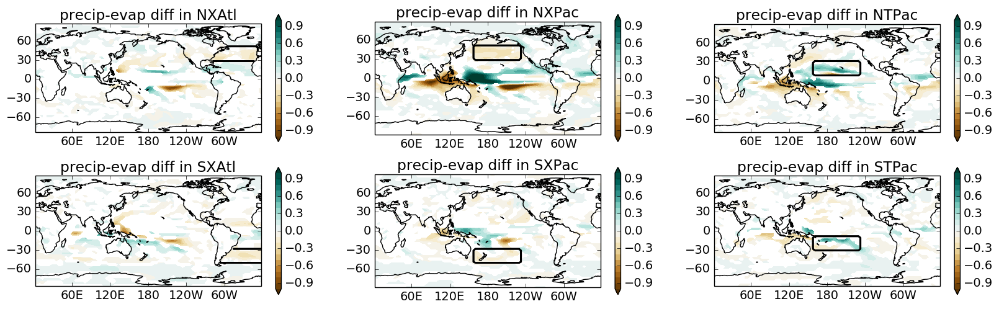

In [79]:
# Figure S2
# Plot P - E
var1 = 'precip'
var2 = 'evap'
vmin = -1; vmax = 1
const = 86400.0

plot_diffs(var1,var2,vmin,vmax,const)

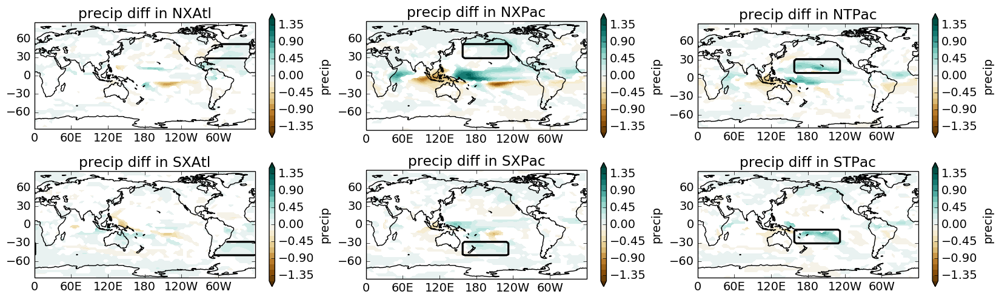

In [80]:
# Figure S3
# Plot precip
var = 'precip'
vmin = -1.5; vmax = 1.5
const = 86400.0
plot_single(var,vmin,vmax,const,cmap='BrBG')

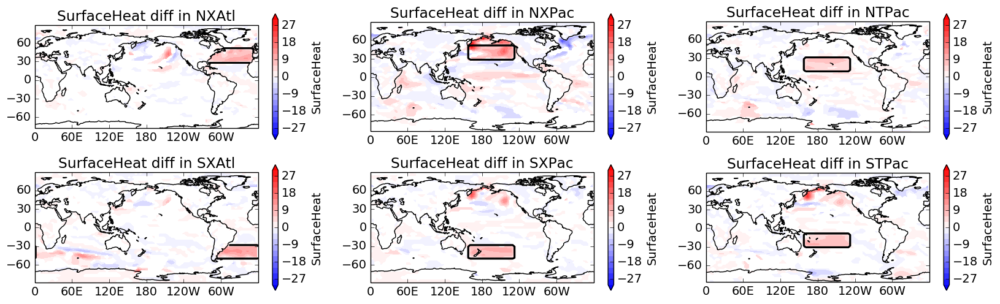

In [81]:
# Figure S4
# SFC radiative and turbulent fluxes
vmin=-30;vmax=30
var = 'SurfaceHeat'
plot_single(var,vmin,vmax)

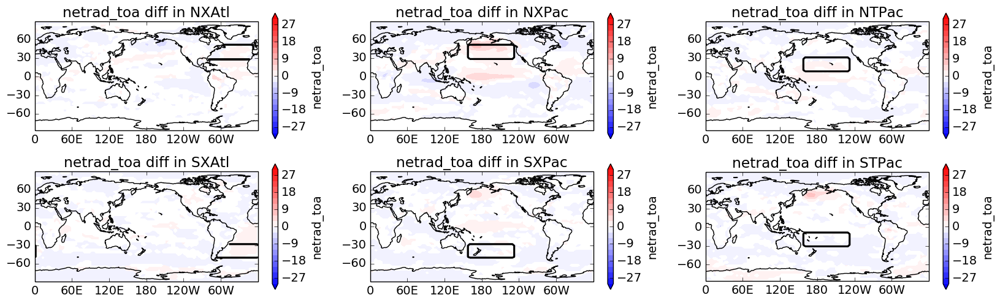

In [82]:
# Figure S5
# SFC radiative and turbulent fluxes
vmin=-30;vmax=30
var = 'netrad_toa'
plot_single(var,vmin,vmax)

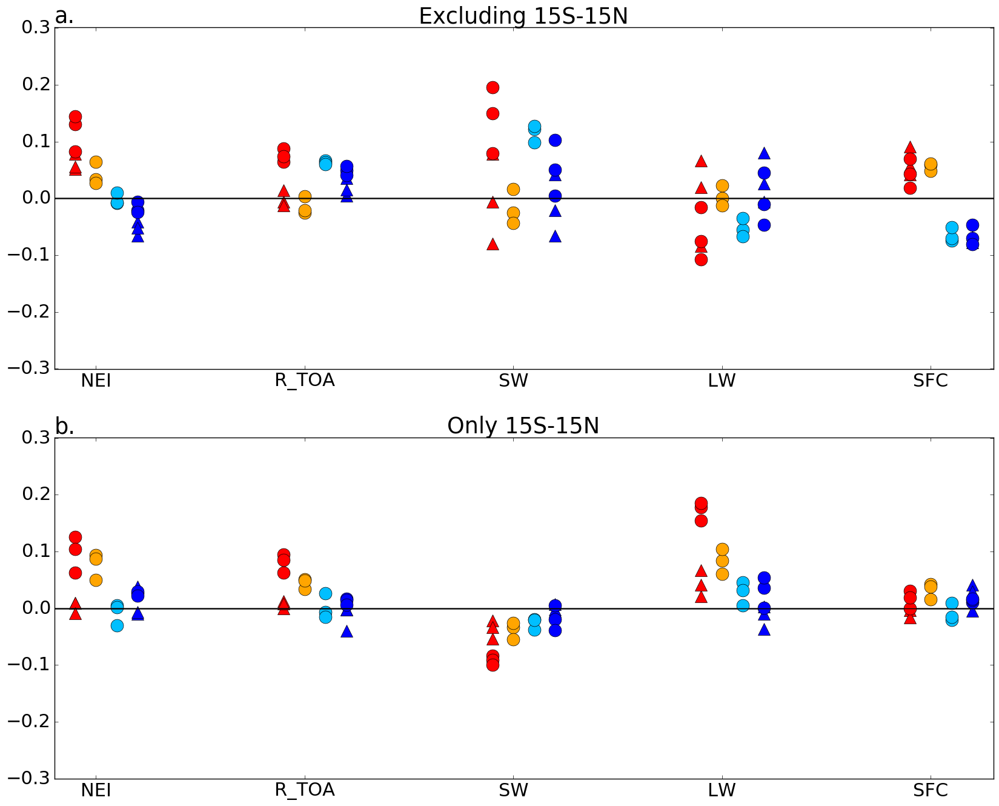

In [83]:
# Figure S6 excluding 15S to 15N
#Plot differences in TOA LW radiation

tropics = 15
nrows = 2
n=1
matplotlib.rcParams['figure.figsize']=(20,nrows * 8)
matplotlib.rcParams.update({'font.size':22})

ax = plt.subplot(nrows,1,n); n+=1

var1 = 'NEI'
const = 1E-15
plot_dots_single(var1,const,add=0,tropics=tropics,pole=90)


var1 = 'netrad_toa'
const = 1E-15
plot_dots_single(var1,const,add=1,tropics=tropics,pole=90)

var1 = 'swdn_toa'
var2 = 'swup_toa'
const = 1E-15
plot_dots_diffs(var1,var2,const,add=2,tropics=tropics,pole=90)

var1 = 'olr'
const = -1E-15
plot_dots_single(var1,const,add=3,tropics=tropics,pole=90)

var1 = 'SurfaceHeat'
const = 1E-15
plot_dots_single(var1,const,add=4,tropics=tropics,pole=90)


plt.xlim(0,4.5)
plt.ylim(-0.301,0.301)
plt.xticks([0.2,1.2,2.2,3.2,4.2], ['NEI','R_TOA','SW','LW','SFC'])
plt.title('Excluding ' + str(tropics) + 'S-' + str(tropics) + 'N')
plt.title('a.',loc='left')

# Figure 3 only 15S to 15N
#Plot differences in TOA LW radiation

ax = plt.subplot(nrows,1,n); n+=1
var1 = 'NEI'
const = 1E-15
plot_dots_single(var1,const,add=0,tropics=0,pole=tropics)


var1 = 'netrad_toa'
const = 1E-15
plot_dots_single(var1,const,add=1,tropics=0,pole=tropics)

var1 = 'swdn_toa'
var2 = 'swup_toa'
const = 1E-15
plot_dots_diffs(var1,var2,const,add=2,tropics=0,pole=tropics)

var1 = 'olr'
const = -1E-15
plot_dots_single(var1,const,add=3,tropics=0,pole=tropics)

var1 = 'SurfaceHeat'
const = 1E-15
plot_dots_single(var1,const,add=4,tropics=0,pole=tropics)


plt.xlim(0,4.5)
plt.ylim(-0.301,0.301)
plt.xticks([0.2,1.2,2.2,3.2,4.2], ['NEI','R_TOA','SW','LW','SFC'])
plt.title('Only ' + str(tropics) + 'S-' + str(tropics) + 'N')
plt.title('b.',loc='left')
plt.show()

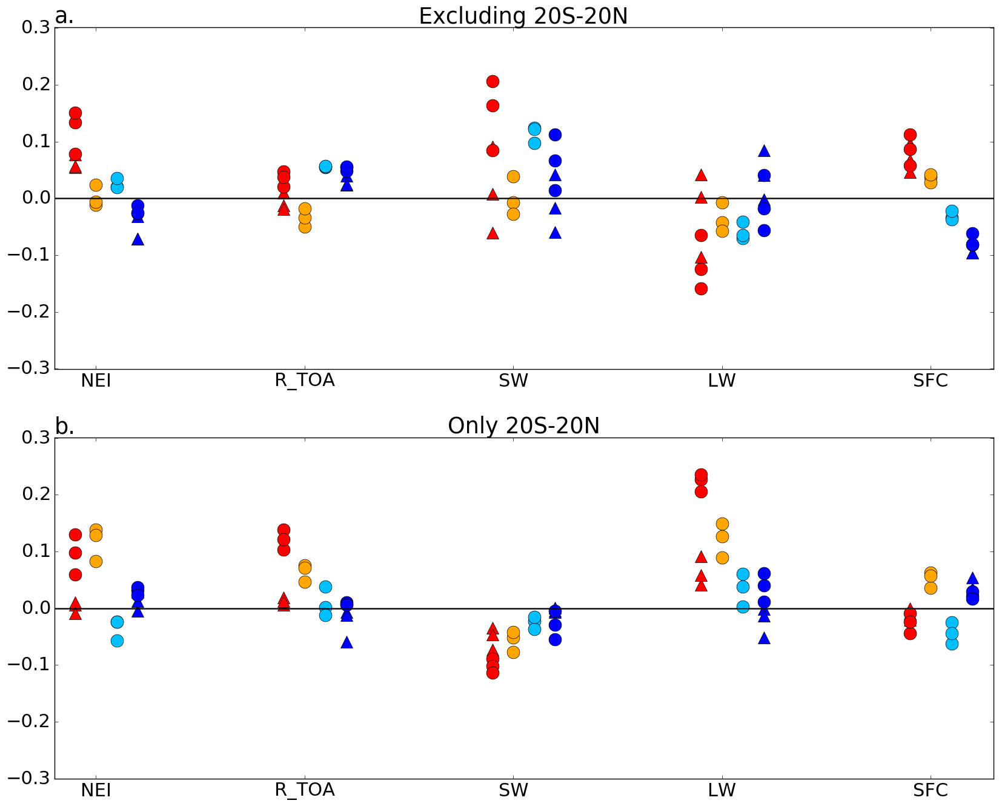

In [84]:
# Figure S6 sensitivity to tropics definition: excluding 20S to 20N
#Plot differences in TOA LW radiation

tropics = 20
nrows = 2
n=1
matplotlib.rcParams['figure.figsize']=(20,nrows * 8)
matplotlib.rcParams.update({'font.size':22})

ax = plt.subplot(nrows,1,n); n+=1

var1 = 'NEI'
const = 1E-15
plot_dots_single(var1,const,add=0,tropics=tropics,pole=90)


var1 = 'netrad_toa'
const = 1E-15
plot_dots_single(var1,const,add=1,tropics=tropics,pole=90)

var1 = 'swdn_toa'
var2 = 'swup_toa'
const = 1E-15
plot_dots_diffs(var1,var2,const,add=2,tropics=tropics,pole=90)

var1 = 'olr'
const = -1E-15
plot_dots_single(var1,const,add=3,tropics=tropics,pole=90)

var1 = 'SurfaceHeat'
const = 1E-15
plot_dots_single(var1,const,add=4,tropics=tropics,pole=90)


plt.xlim(0,4.5)
plt.ylim(-0.301,0.301)
plt.xticks([0.2,1.2,2.2,3.2,4.2], ['NEI','R_TOA','SW','LW','SFC'])
plt.title('Excluding ' + str(tropics) + 'S-' + str(tropics) + 'N')
plt.title('a.',loc='left')

# Figure 3 only 15S to 15N
#Plot differences in TOA LW radiation

ax = plt.subplot(nrows,1,n); n+=1
var1 = 'NEI'
const = 1E-15
plot_dots_single(var1,const,add=0,tropics=0,pole=tropics)


var1 = 'netrad_toa'
const = 1E-15
plot_dots_single(var1,const,add=1,tropics=0,pole=tropics)

var1 = 'swdn_toa'
var2 = 'swup_toa'
const = 1E-15
plot_dots_diffs(var1,var2,const,add=2,tropics=0,pole=tropics)

var1 = 'olr'
const = -1E-15
plot_dots_single(var1,const,add=3,tropics=0,pole=tropics)

var1 = 'SurfaceHeat'
const = 1E-15
plot_dots_single(var1,const,add=4,tropics=0,pole=tropics)


plt.xlim(0,4.5)
plt.ylim(-0.301,0.301)
plt.xticks([0.2,1.2,2.2,3.2,4.2], ['NEI','R_TOA','SW','LW','SFC'])
plt.title('Only ' + str(tropics) + 'S-' + str(tropics) + 'N')
plt.title('b.',loc='left')
plt.show()

## Table values

## Extra Plots

### Cloud

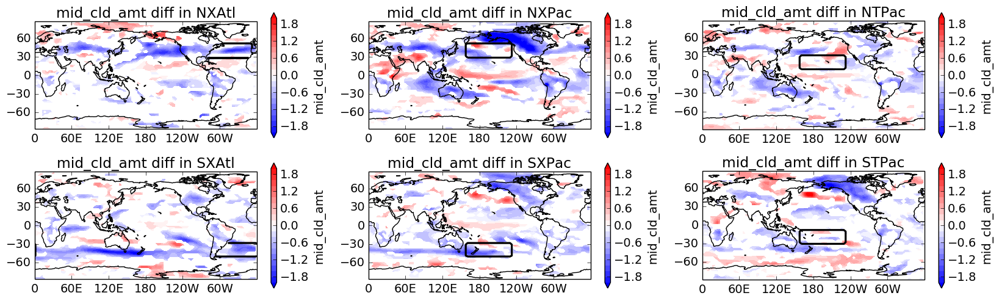

In [85]:
# Plot mid cloud amount
vmin = -2; vmax = 2
plot_single('mid_cld_amt',vmin,vmax)


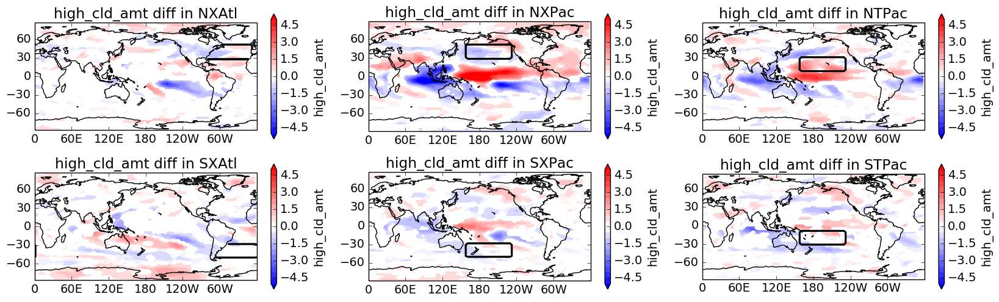

In [86]:
# Plot high cloud amount
vmin = -5; vmax = 5
plot_single('high_cld_amt',vmin,vmax)


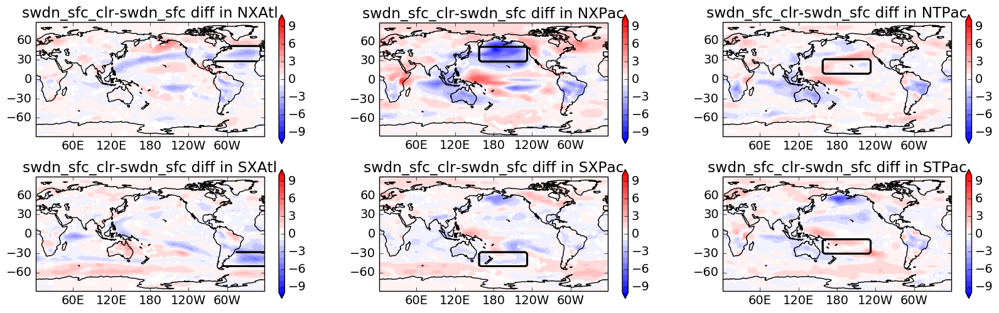

In [87]:
# SW cloud radiative forcing at Surface (swdn_clr - swdn_all)
vmin=-10;vmax=10
var1 = 'swdn_sfc_clr'
var2 = 'swdn_sfc'
plot_diffs(var1,var2,vmin,vmax,cmap='bwr')


### Radiative fluxes

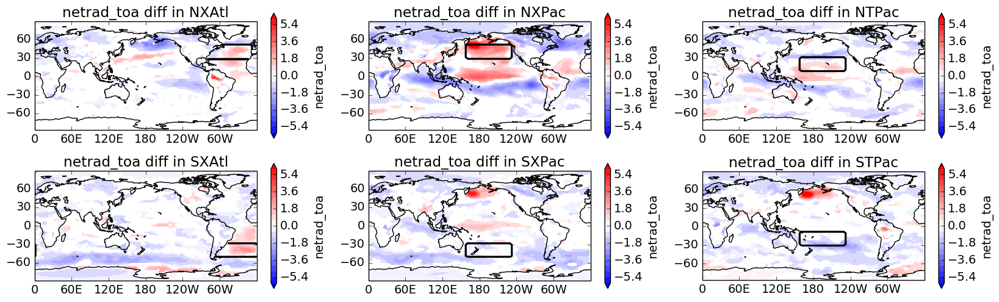

In [88]:
# TOA net radiation
vmin=-6;vmax=6
var = 'netrad_toa'
plot_single(var,vmin,vmax)

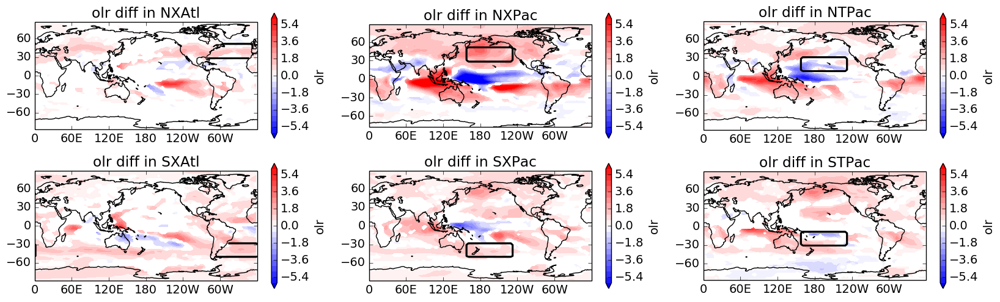

In [89]:
# Outgoing longwave radiation TOA
vmin=-6;vmax=6
var = 'olr'
plot_single(var,vmin,vmax)

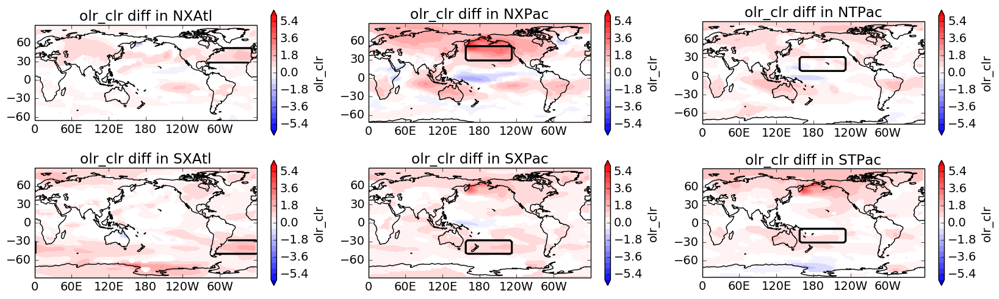

In [90]:
# Clear sky Outgoing longwave radiation
vmin=-6;vmax=6
var = 'olr_clr'
plot_single(var,vmin,vmax)

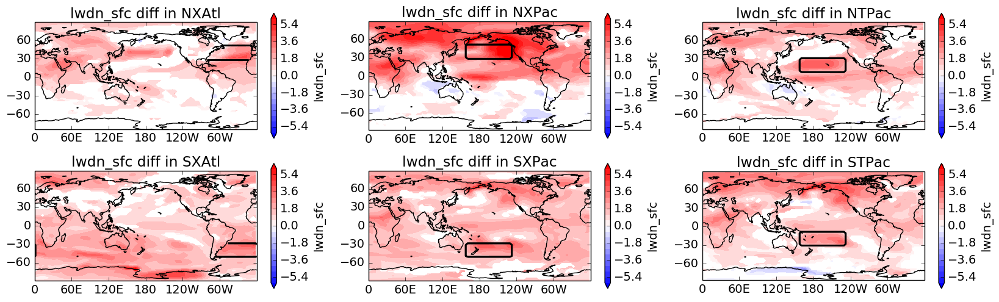

In [91]:
# Surface down LW
vmin=-6;vmax=6
var = 'lwdn_sfc'
plot_single(var,vmin,vmax)


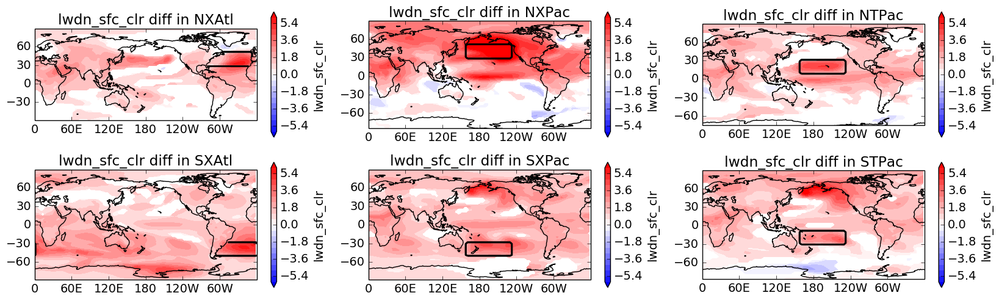

In [92]:
# Surface down clear sky LW
vmin=-6;vmax=6
var = 'lwdn_sfc_clr'
plot_single(var,vmin,vmax)


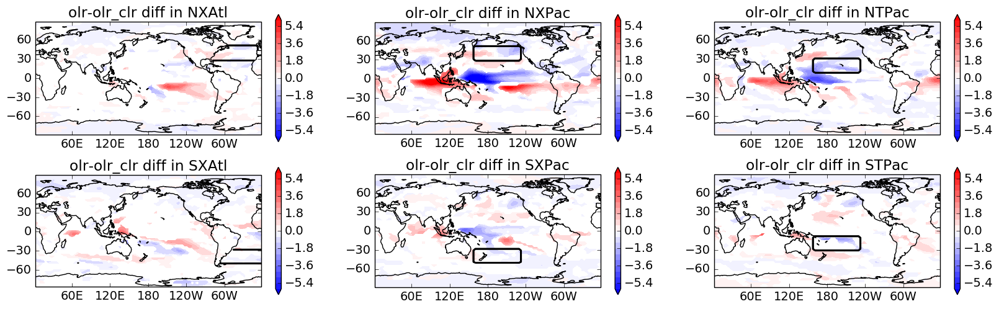

In [93]:
# Cloud longwave forcing TOA
vmin=-6;vmax=6
var1 = 'olr'
var2 = 'olr_clr'
plot_diffs(var1,var2,vmin,vmax,cmap='bwr')

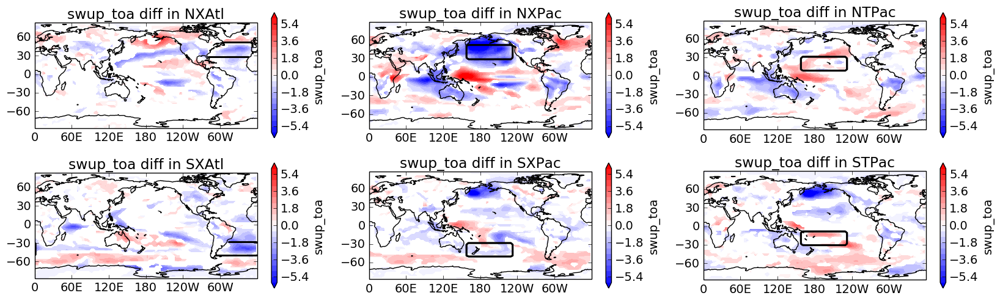

In [94]:
# TOA SW up
vmin=-6;vmax=6
var = 'swup_toa'
plot_single(var,vmin,vmax)

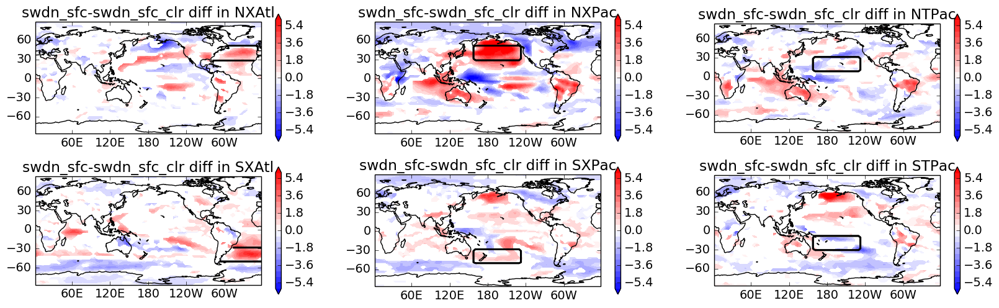

In [95]:
# Cloud SW forcing at surface swdn_all - swdn_clr
vmin=-6;vmax=6
var1 = 'swdn_sfc'
var2 = 'swdn_sfc_clr'
plot_diffs(var1,var2,vmin,vmax,cmap='bwr')

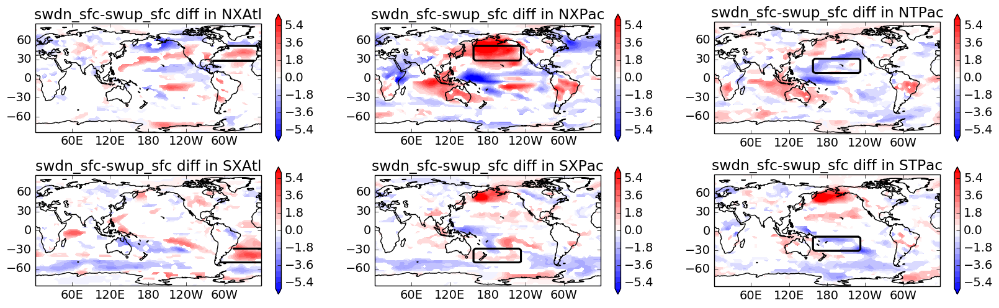

In [96]:
# Net surface shortwave radiation at surface
vmin=-6;vmax=6
var1 = 'swdn_sfc'
var2 = 'swup_sfc'
plot_diffs(var1,var2,vmin,vmax,cmap='bwr')


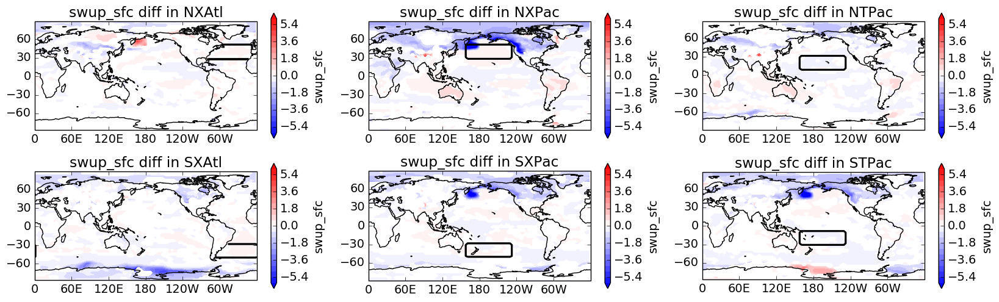

In [97]:
# Upward shortwave radiation at surface
vmin=-6;vmax=6
var = 'swup_sfc'
plot_single(var,vmin,vmax)

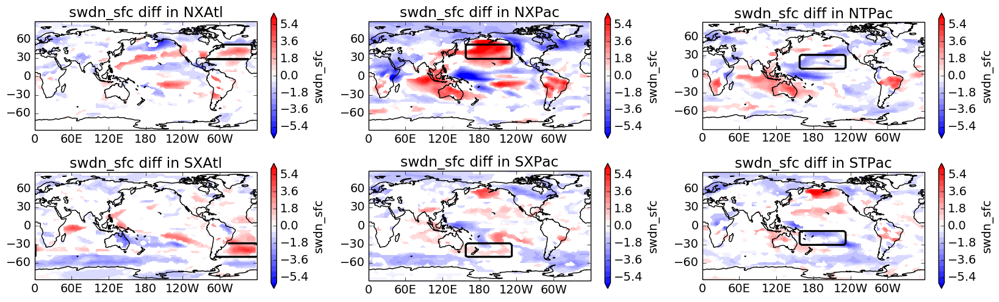

In [98]:
# Downward shortwave radiation at surface
vmin=-6;vmax=6
var = 'swdn_sfc'
plot_single(var,vmin,vmax)

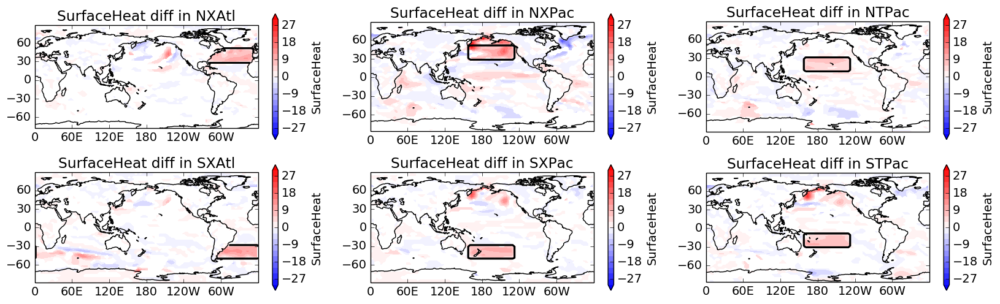

In [99]:
# SFC radiative and turbulent fluxes
vmin=-30;vmax=30
var = 'SurfaceHeat'
plot_single(var,vmin,vmax)

### Surface Pressure

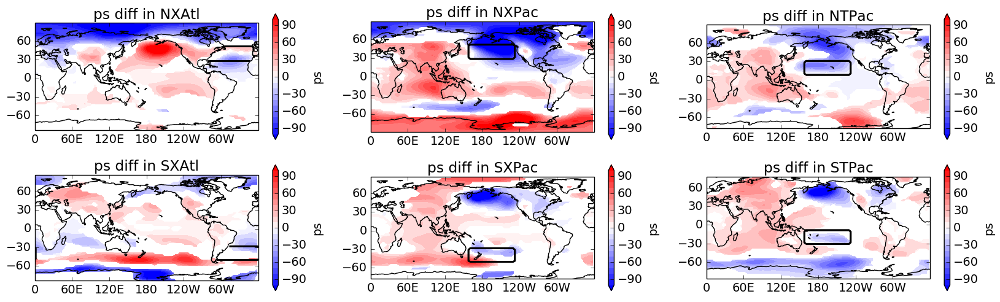

In [100]:
# Surface Pressure
vmin=-100;vmax=100
plot_single('ps',vmin,vmax)


### Surface humidity

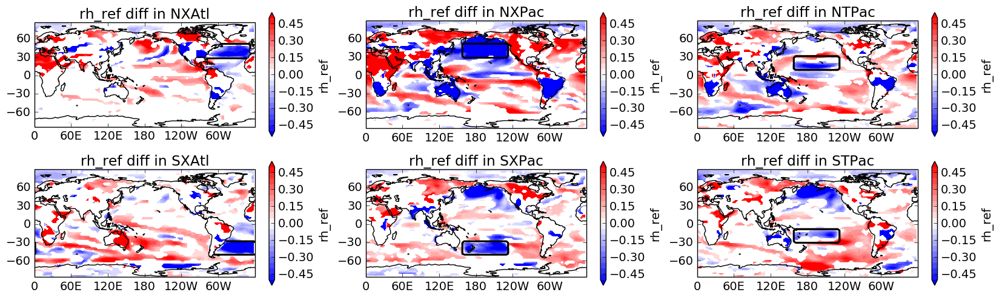

In [101]:
# Plot reference height relative humidity
vmin = -0.5; vmax = 0.5
plot_single('rh_ref',vmin,vmax)


### Precip and Evaporation

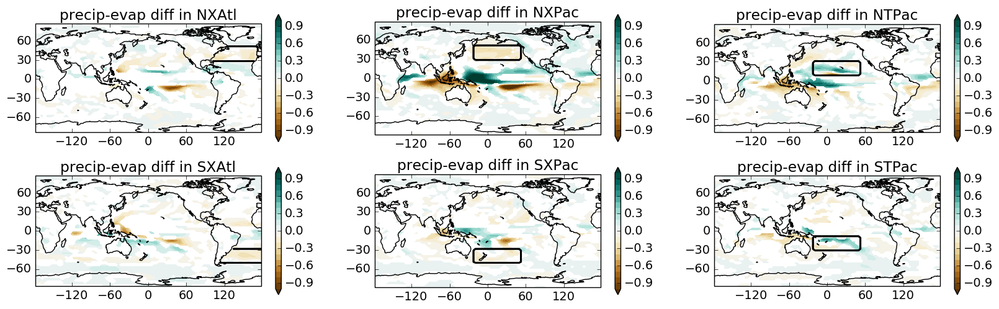

In [50]:
# Plot P - E
var1 = 'precip'
var2 = 'evap'
vmin = -1; vmax = 1
const = 86400.0

plot_diffs(var1,var2,vmin,vmax,const)

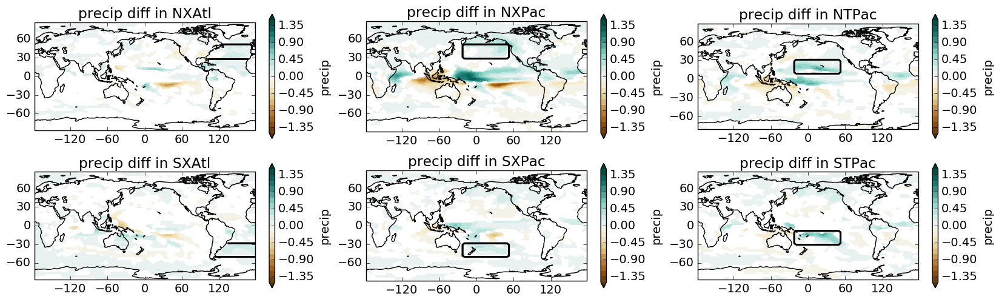

In [51]:
# Plot precip
var = 'precip'
vmin = -1.5; vmax = 1.5
const = 86400.0
plot_single(var,vmin,vmax,const,cmap='BrBG')

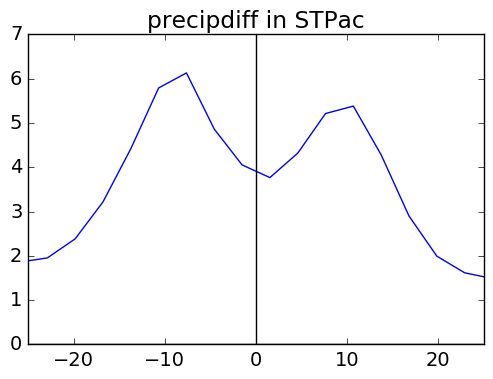

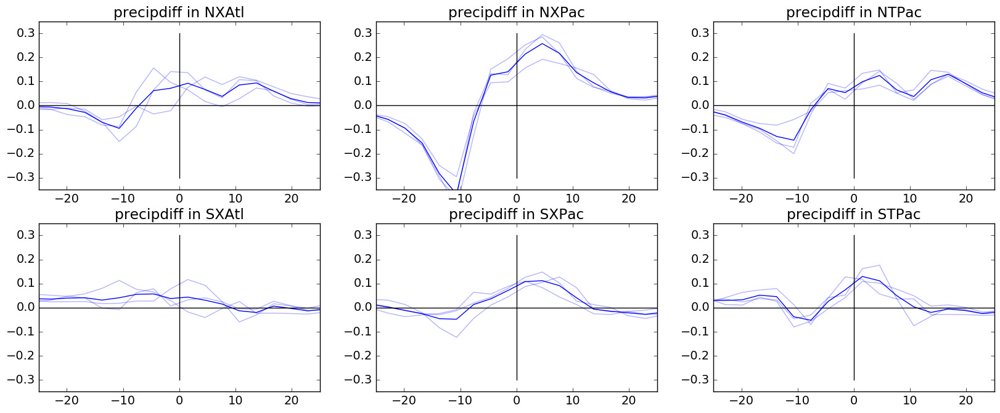

In [59]:
# Plot zonal mean precip
nrows=1
matplotlib.rcParams['figure.figsize']=(20,nrows *4)
matplotlib.rcParams.update({'font.size':14})

n=1
cenlon = 180
var = 'precip'
vmin = -2; vmax = 2
const = 86400.0

ax = plt.subplot(nrows,3,n); n+=1

ctlplot = const * atmosEA['ctl'][var].mean(dim='lon')
ctlplot.plot(color='b',label = 'ctl')

plt.title(var + 'diff in ' + names[exp])
plt.xlim(-25,25)
plt.xlabel('')
plt.ylabel('')
plt.plot([-25,25],[0,0],color='k')
plt.plot([0,0],[0,7],color='k')

plt.show()

nrows=3
matplotlib.rcParams['figure.figsize']=(20,nrows *4)
matplotlib.rcParams.update({'font.size':14})

n=1

for exp in exps:
    ax = plt.subplot(nrows,3,n); n+=1
    toplot = const * (atmosEA[exp][var].mean(dim='lon') - atmosEA['ctl'][var].mean(dim='lon')) 
    
    EN1 = const * (atmos[exp][1][var].mean(dim='lon') - atmosEA['ctl'][var].mean(dim='lon'))
    EN2 = const * (atmos[exp][2][var].mean(dim='lon') - atmosEA['ctl'][var].mean(dim='lon'))
    EN3 = const * (atmos[exp][3][var].mean(dim='lon') - atmosEA['ctl'][var].mean(dim='lon'))

    EN1.plot(color='b',label = names[exp] + ' - ctl',alpha = 0.3 )
    EN2.plot(color='b',label = names[exp] + ' - ctl',alpha = 0.3 )
    EN3.plot(color='b',label = names[exp] + ' - ctl',alpha = 0.3 )
    
    toplot.plot(color='b',label = names[exp] + ' - ctl')

    plt.title(var + 'diff in ' + names[exp])
    plt.xlim(-25,25)
    plt.ylim(-0.35,0.35)
    plt.xlabel('')
    plt.ylabel('')
    plt.plot([-25,25],[0,0],color='k')
    plt.plot([0,0],[-0.3,0.3],color='k')

### Ocean cross-sections, depth plots, and surface maps

NXAtl: 


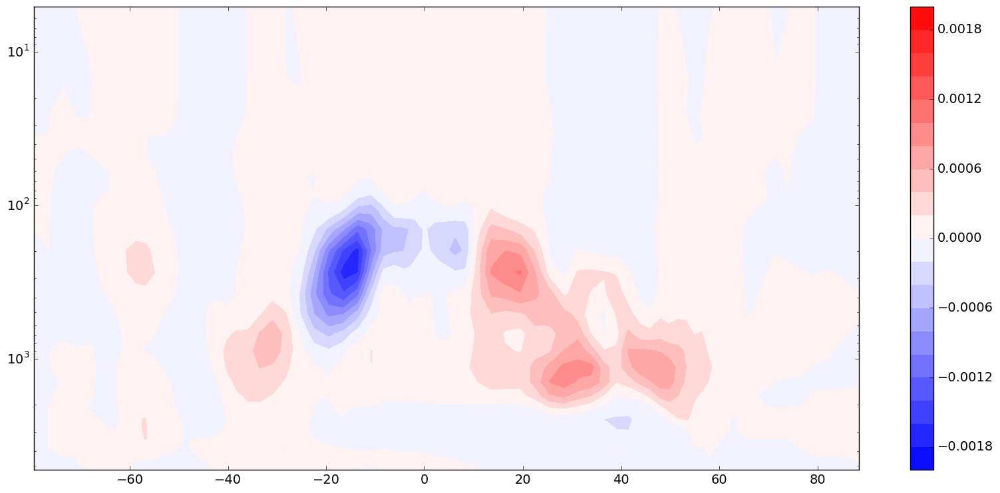

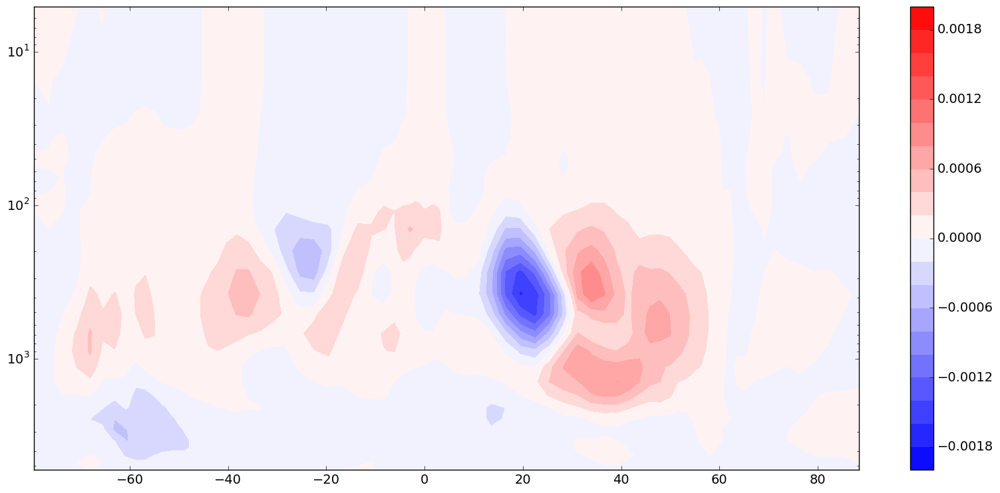

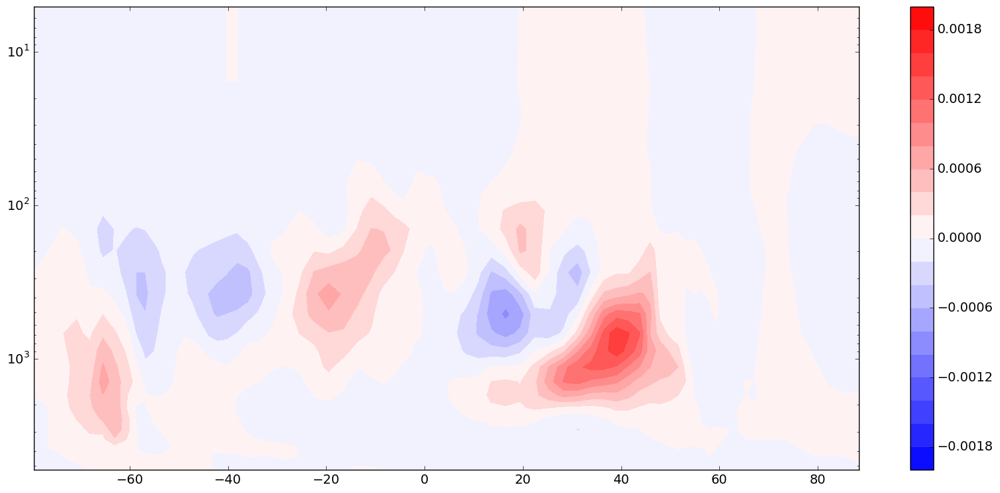

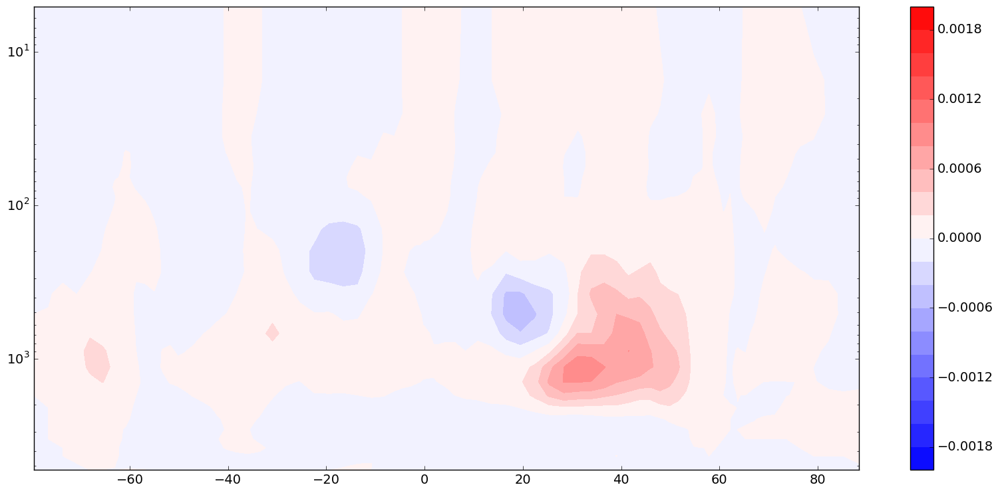

NXPac: 


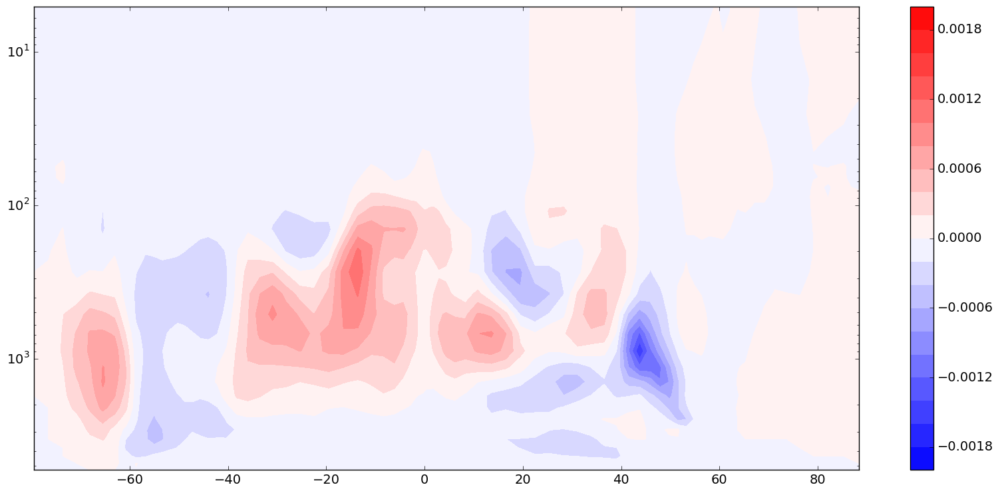

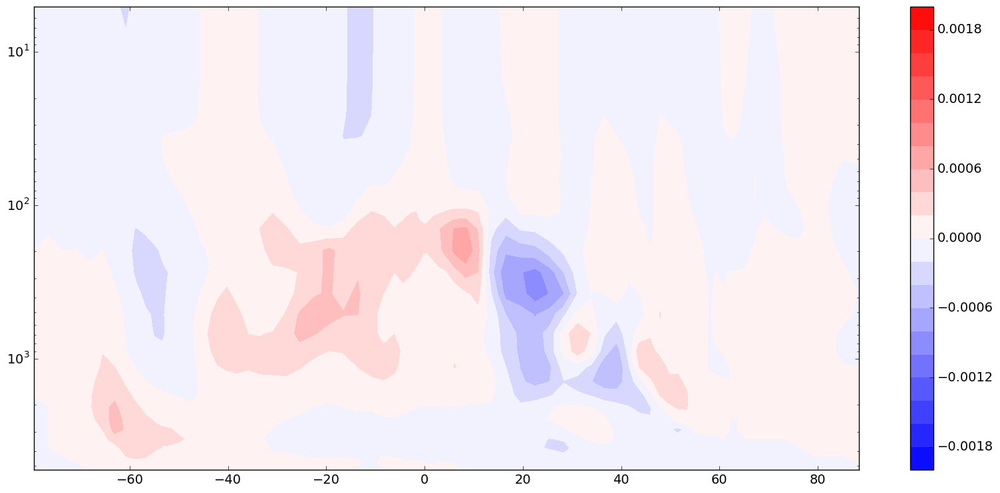

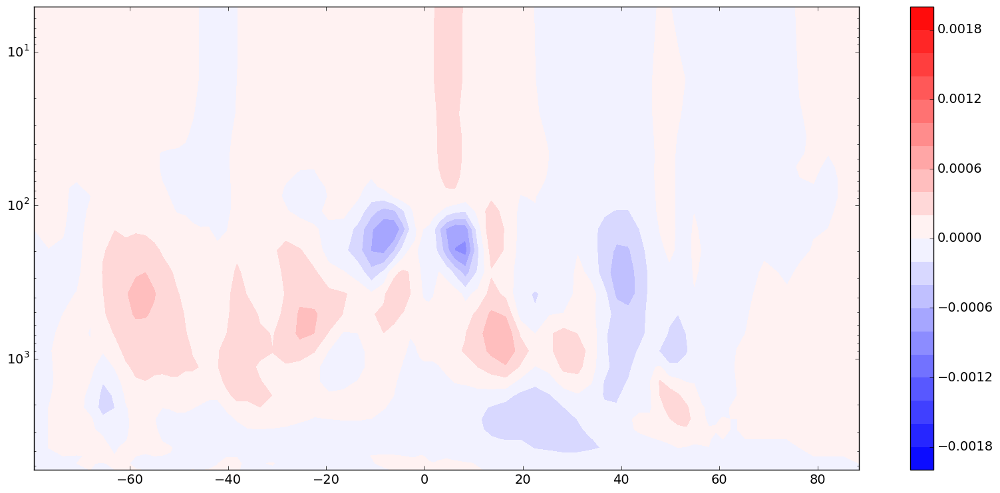

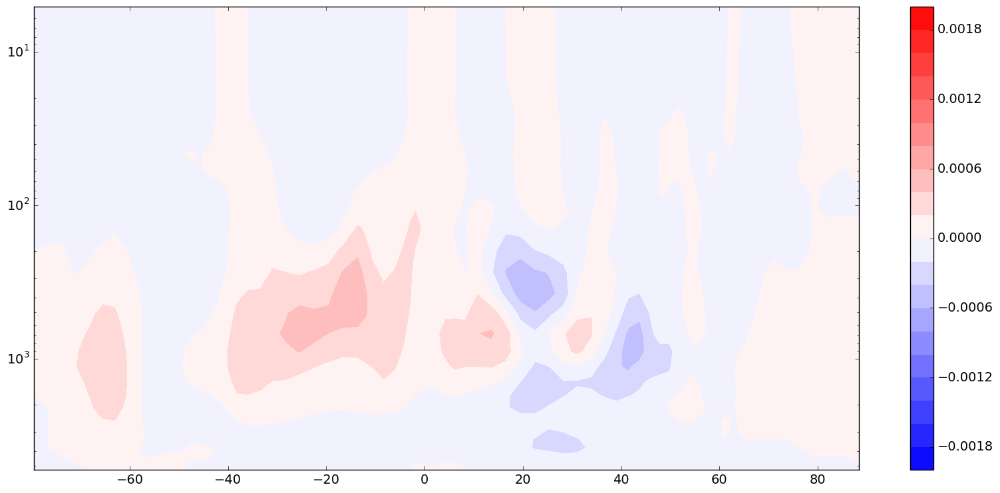

NTPac: 


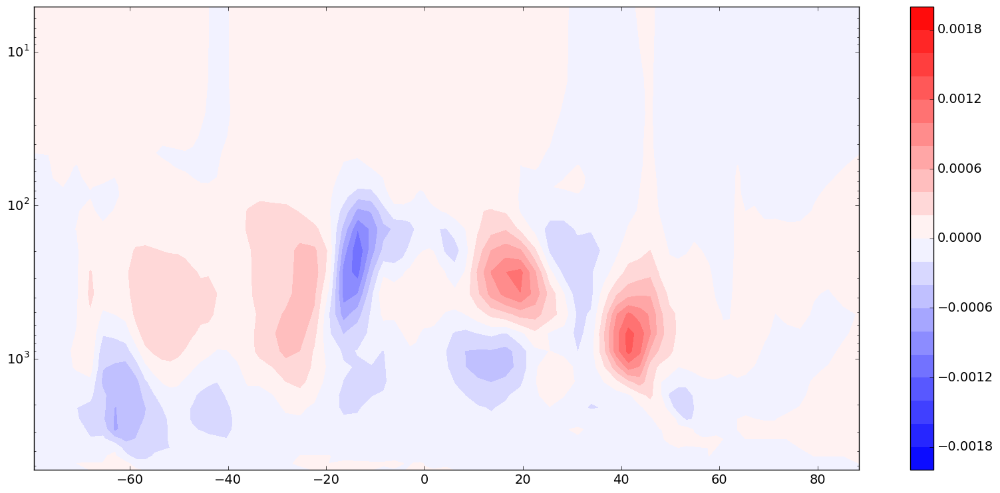

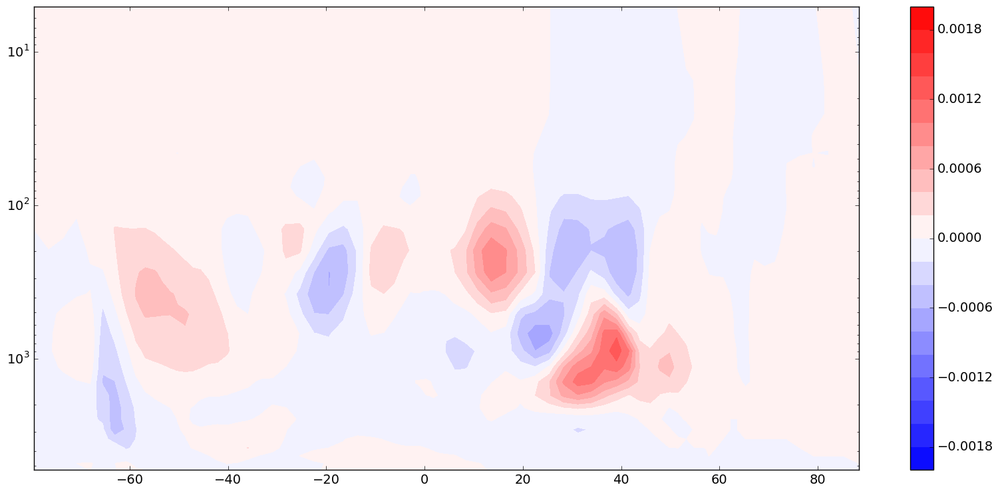

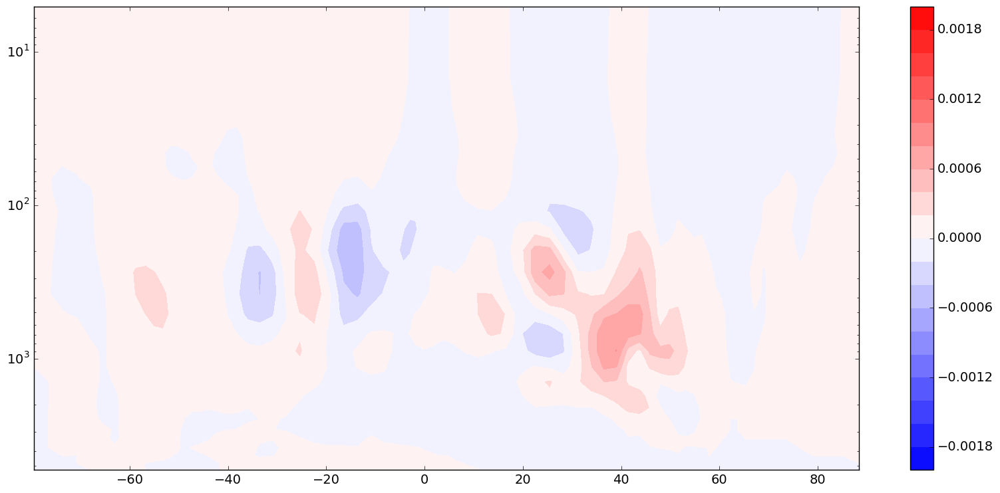

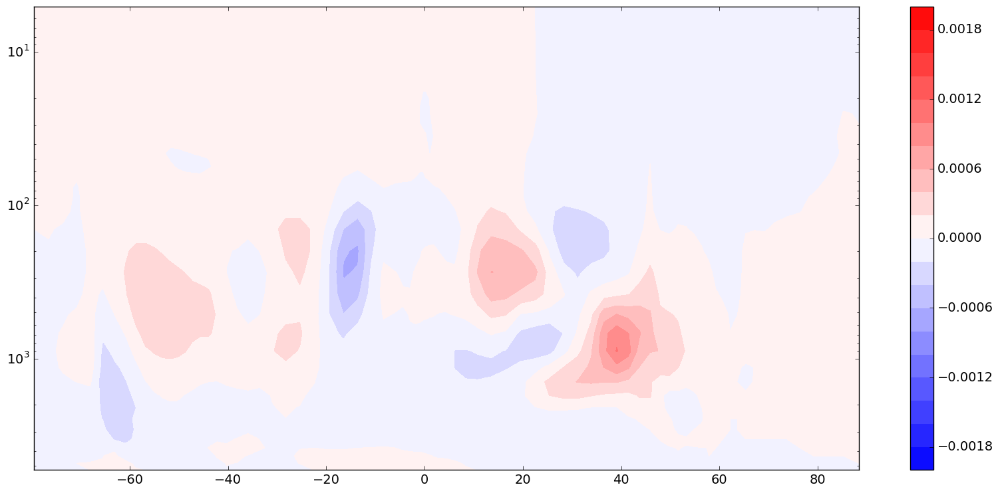

SXAtl: 


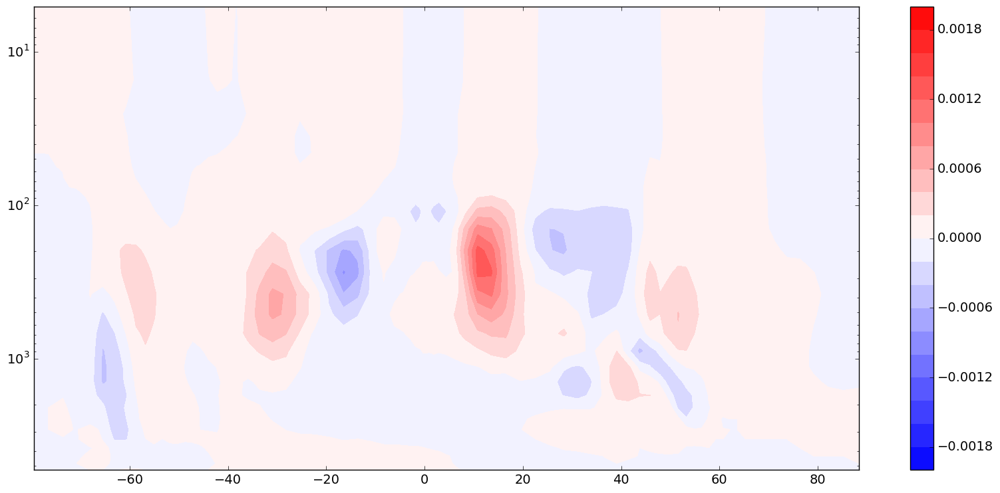

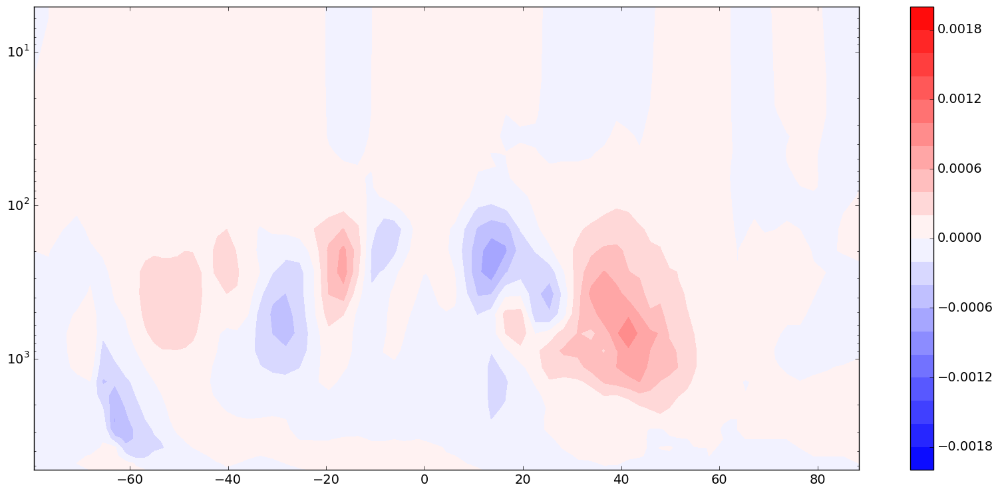

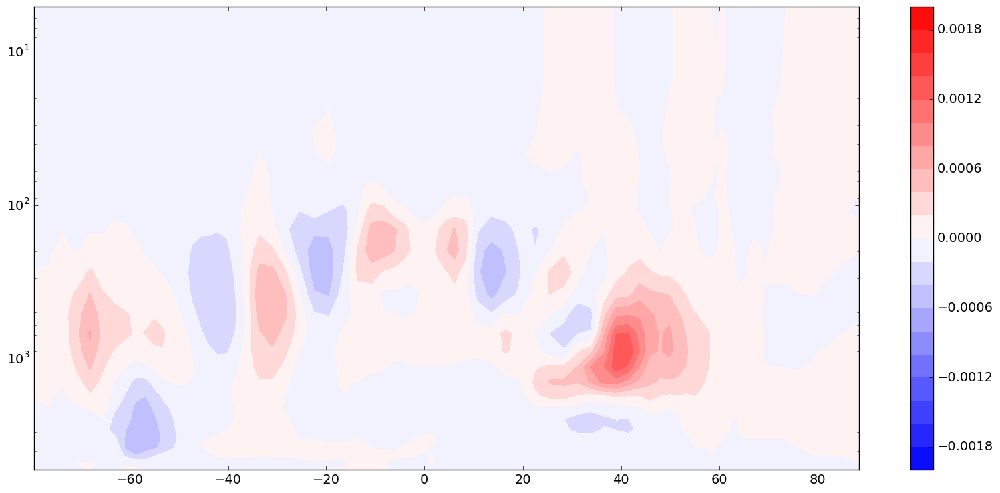

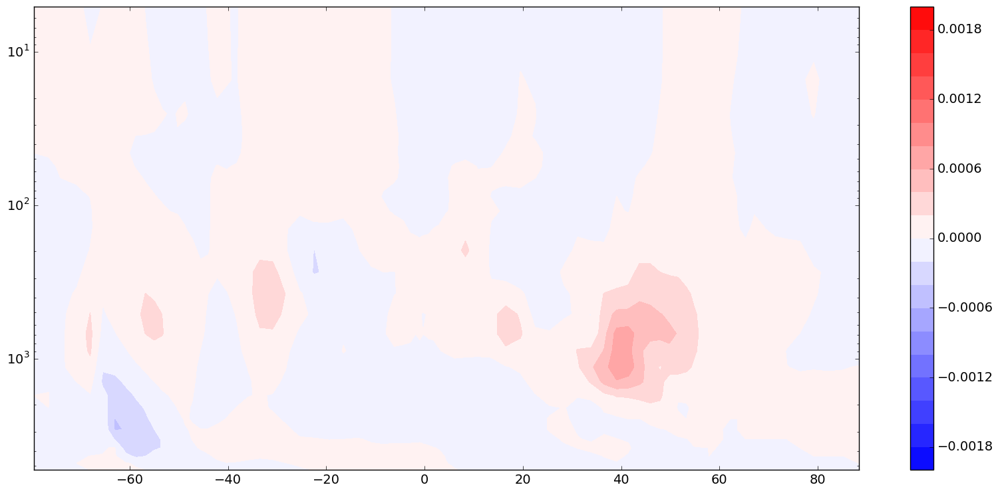

SXPac: 


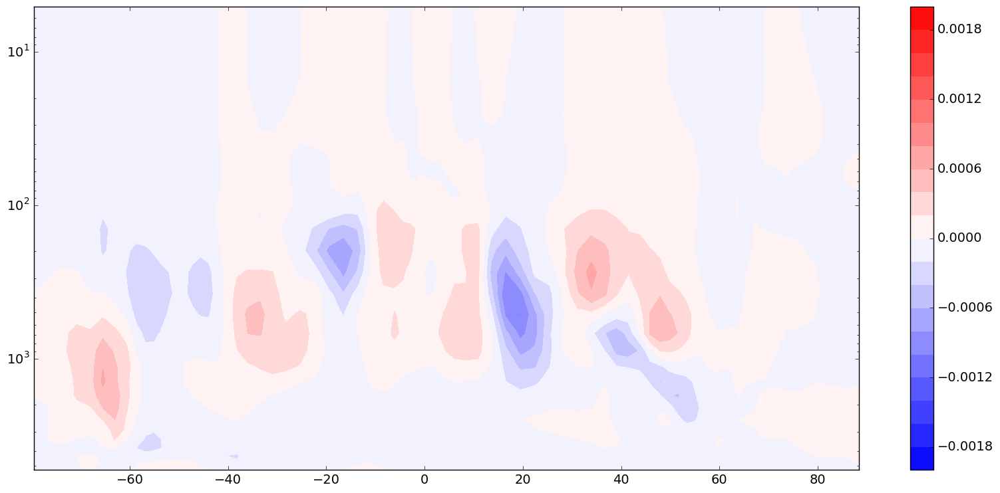

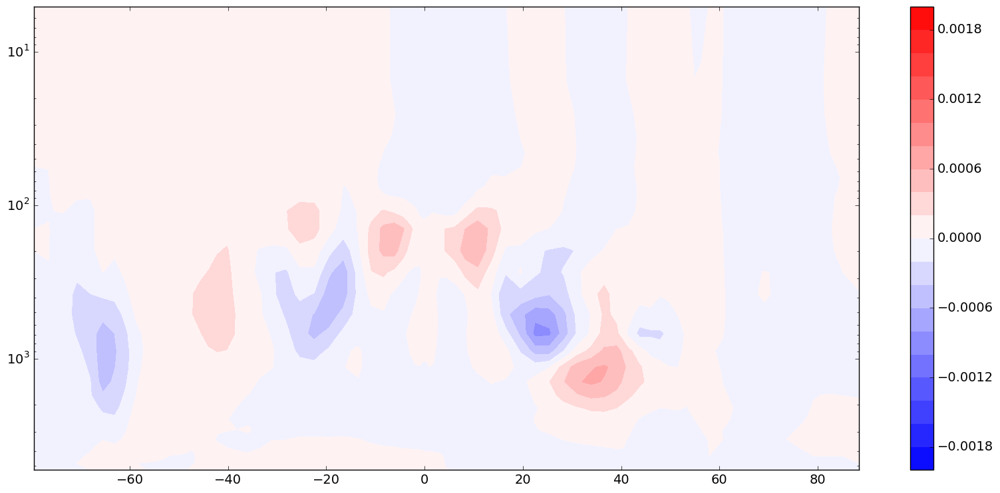

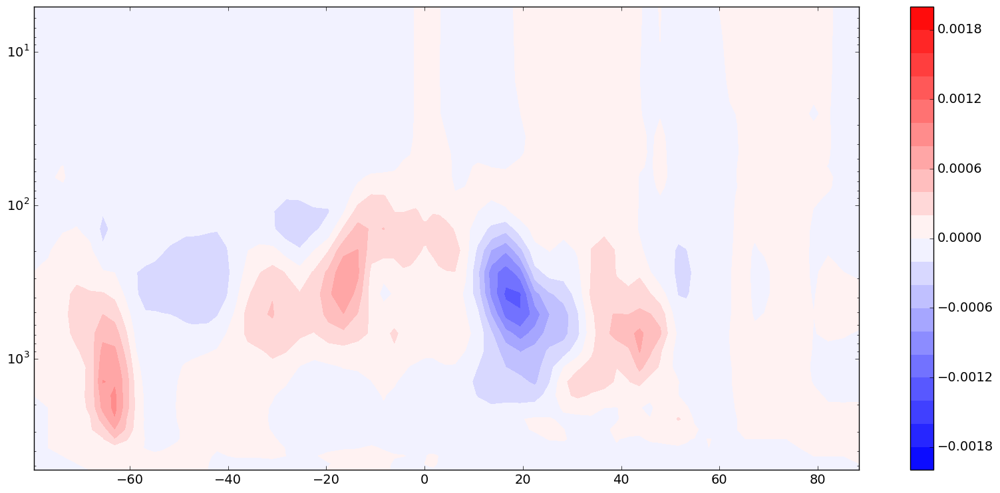

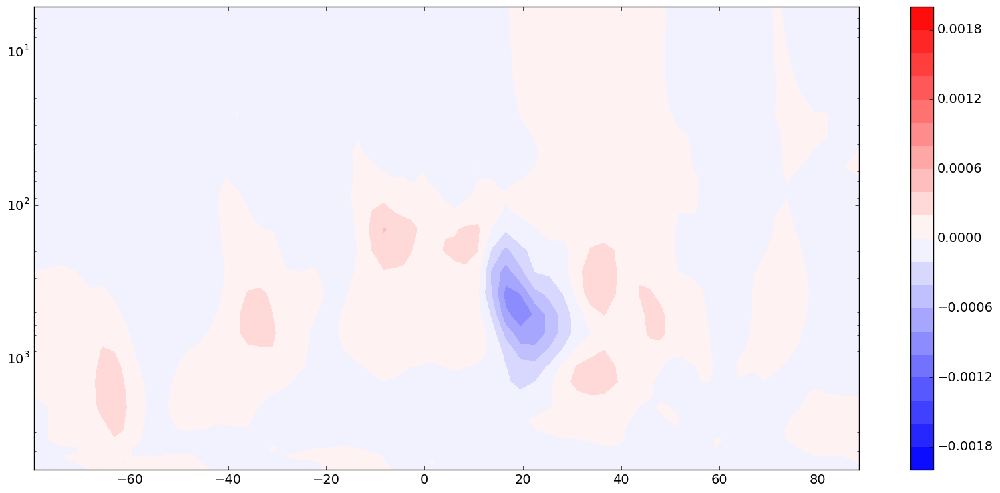

STPac: 


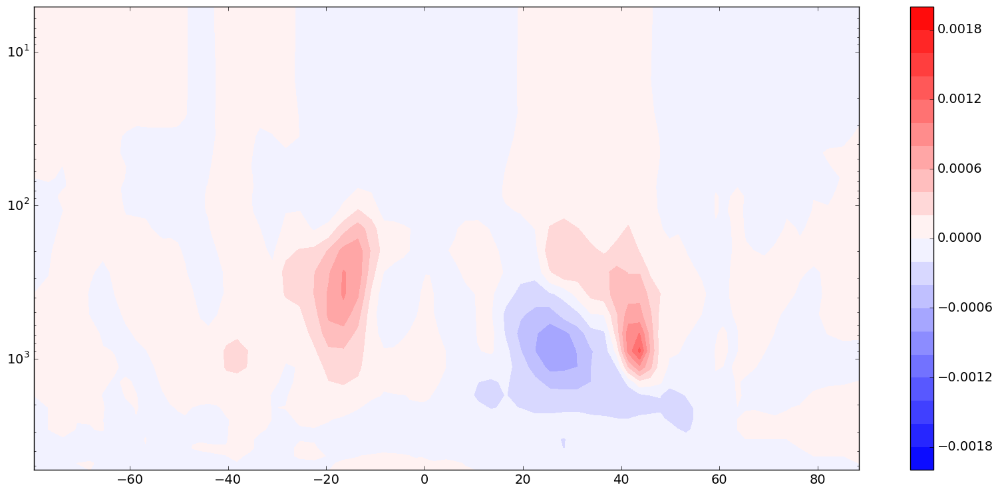

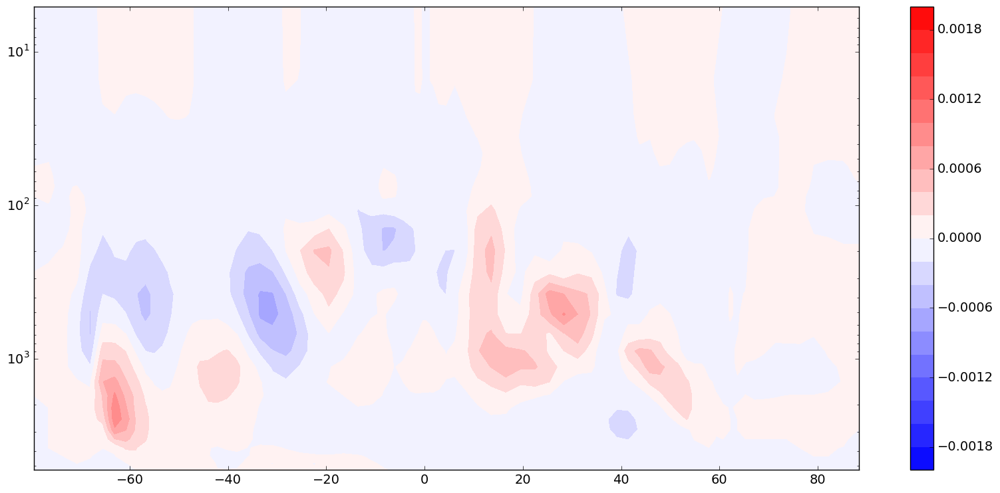

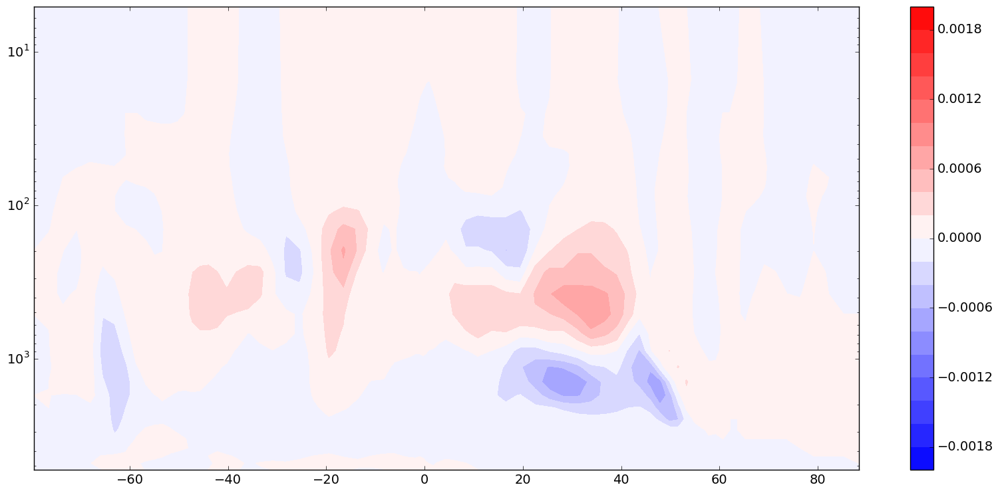

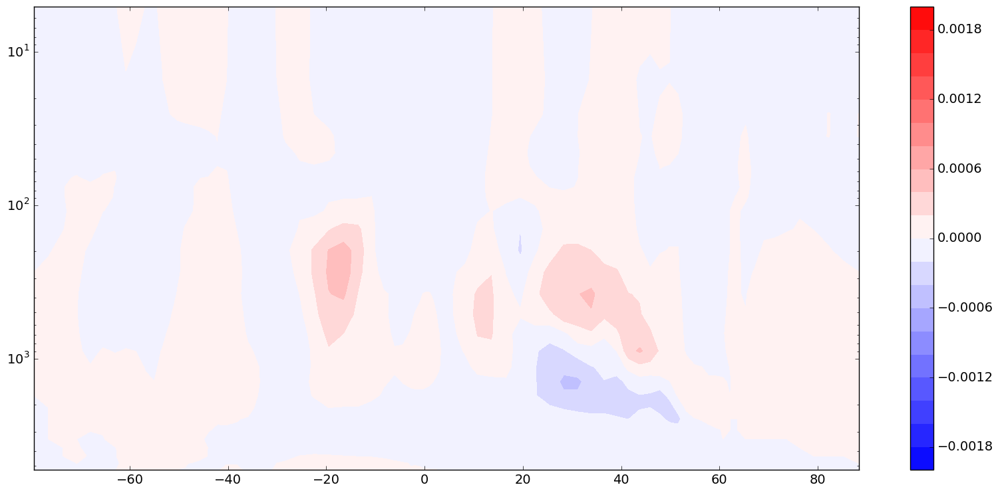

In [52]:
## OHC cross-sections

for exp in exps:
    print(names[exp] + ': ')
    
    DeltaOHC_E = {}
    for EM in range(1,4):
        colHCstart = (shr_const_mod.SHR_CONST_CPSW * 
                            (oceanTS[exp][EM]['temp'].isel(time=0) * 
                             oceanTS[exp][EM]['rho_dzt'].isel(time=0)))
        totHCstart = (areaO * colHCstart).sum(dim=['xt_ocean'])             

        colHCend = (shr_const_mod.SHR_CONST_CPSW * 
                        (oceanTS[exp][EM]['temp'].isel(time=39) * 
                         oceanTS[exp][EM]['rho_dzt'].isel(time=39)))
        
        totHCend = (areaO * colHCend).sum(dim=['xt_ocean']) 
     
        # Take difference, and divide by 40 years in seconds to get W.
        DeltaOHC = ((totHCend-totHCstart)/(365.0 * 39.0 * 24.0 * 60.0 * 60.0))
        # Divide by 1E15 to get PW
        DeltaOHC = DeltaOHC/1E15     
        
        plt.contourf(DeltaOHC.yt_ocean,DeltaOHC.st_ocean,DeltaOHC.values.T,cmap='bwr',levels=np.linspace(-0.002,0.002,21))
        plt.colorbar()
        plt.yscale('log')
        plt.gca().invert_yaxis()
        #DeltaOHC.plot()
        plt.show()
        DeltaOHC_E[EM] = DeltaOHC
    total = (1.0/3.0) * (DeltaOHC_E[1] + DeltaOHC_E[2].values + DeltaOHC_E[3].values )
    plt.contourf(DeltaOHC.yt_ocean,DeltaOHC.st_ocean,total.values.T,cmap='bwr',levels=np.linspace(-0.002,0.002,21))
    plt.colorbar()
    plt.yscale('log')
    plt.gca().invert_yaxis()
    plt.show()
    #print('max: ' + "{:03.3f}".format(np.max([DeltaOHC_E[1],DeltaOHC_E[2],DeltaOHC_E[3]])))  
    #print('mean: ' + "{:03.3f}".format(np.mean([DeltaOHC_E[1],DeltaOHC_E[2],DeltaOHC_E[3]]))) 
    #print('min: ' + "{:03.3f}".format(np.min([DeltaOHC_E[1],DeltaOHC_E[2],DeltaOHC_E[3]]))) 
    #print('')

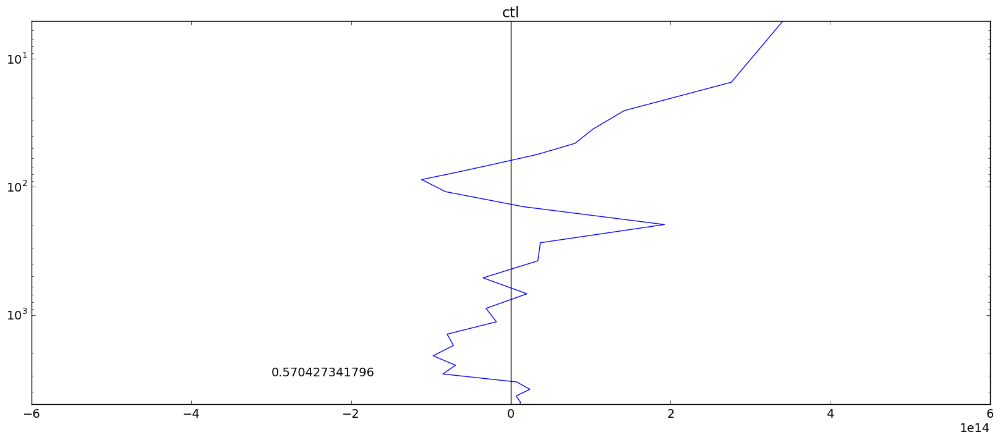

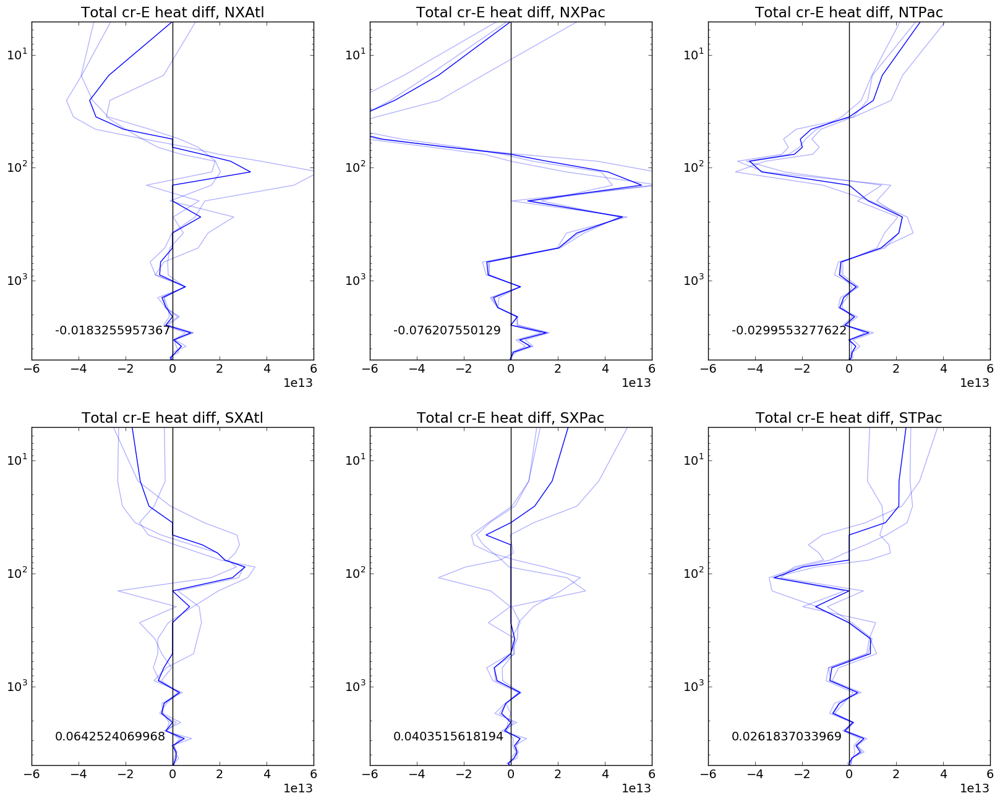

In [49]:
# Plot Total heat flux
n=1
cenlon = 180
var1 = 'temp_yflux_adv'
var2 = 'temp_yflux_gm'
var3 = 'temp_yflux_submeso'
var4 = 'temp_yflux_ndiffuse'

vmin= -0.6E14
vmax=0.6E14

const = 1.0

nrows=1
matplotlib.rcParams['figure.figsize']=(20,nrows *8)
matplotlib.rcParams.update({'font.size':14})
toplotthick = get_eq_thick('ctl')

toplot = (get_eq_tot(oceanEA['ctl']))

toplot = toplot.sum(dim='xt_ocean')
total = toplot.sum()

plt.plot(toplot.values,toplot.st_ocean.values)
plt.yscale('log')
plt.gca().invert_yaxis()
plt.title('ctl')
plt.plot([0,0],[5000,0],color='k')
plt.ylim(5000,0)
plt.xlim(-0.6E15,0.6E15)
plt.xlabel('')
plt.ylabel('')
plt.text(-3.0E14,3000,str(total.values/1E15))

plt.show()

nrows=3
matplotlib.rcParams['figure.figsize']=(20,nrows *8)
matplotlib.rcParams.update({'font.size':14})

for exp in exps:
    ax = plt.subplot(nrows,3,n); n+=1

    thickctl = get_eq_thick('ctl')
    thickexp = get_eq_thick(exp)
    
    ctlvalues = get_eq_tot(oceanEA['ctl'])
    
    toplot = (get_eq_tot(oceanEA[exp]) - ctlvalues)
    
    thickexp1 = get_eq_thickEM(exp,1)
    thickexp2 = get_eq_thickEM(exp,2)
    thickexp3 = get_eq_thickEM(exp,3)
    EN1 = (get_eqtotEM(ocean[exp][1]) - ctlvalues).sum(dim='xt_ocean')
    EN2 = (get_eqtotEM(ocean[exp][2]) - ctlvalues).sum(dim='xt_ocean')
    EN3 = (get_eqtotEM(ocean[exp][3]) - ctlvalues).sum(dim='xt_ocean')
    
    sign1 = np.sign(EN1)
    sign2 = np.sign(EN2)
    sign3 = np.sign(EN3)

    mask = np.where(sign1 == sign2,1.0,0.0)
    mask = mask * np.where(sign1 == sign3,1.0,0.0)    
    
    toplot = toplot.sum(dim='xt_ocean')
    total = toplot.sum()
    
    toplot.values = toplot.values * mask
    
    plt.plot(EN1.values,EN1.st_ocean.values,alpha = 0.3,linestyle='-',color='b')
    plt.plot(EN2.values,EN2.st_ocean.values,alpha = 0.3,linestyle='-',color='b')
    plt.plot(EN3.values,EN3.st_ocean.values,alpha = 0.3,linestyle='-',color='b')
    plt.plot(toplot.values,toplot.st_ocean.values)
    # Output variables are total W in that layer, so plotting on a log plot gives
    # an approximate visualization of relative W/m in each layer
    plt.yscale('log')    
    plt.gca().invert_yaxis()
    plt.title('Total cr-E heat diff, ' + names[exp])
    plt.plot([0,0],[5000,0],color='k')
    plt.ylim(5000,0)
    plt.xlim(vmin,vmax)
    plt.xlabel('')
    plt.ylabel('')
    plt.text(-5.0E13,3000,str(total.values/1E15))

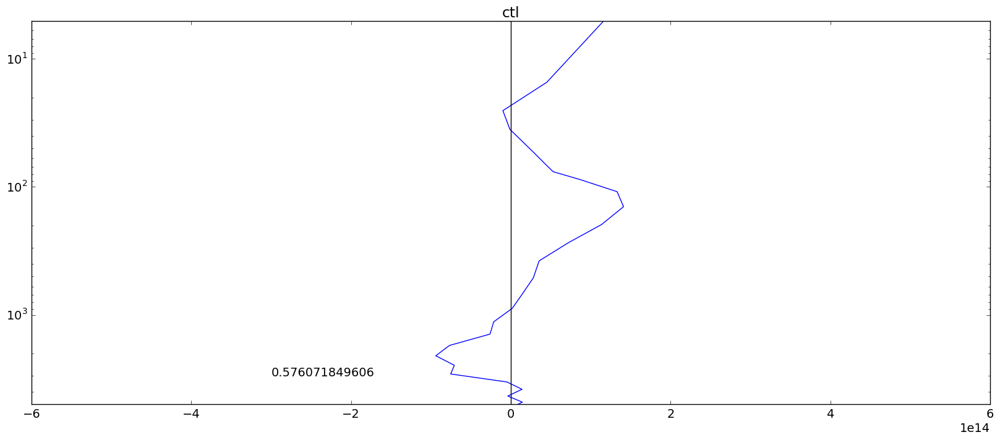

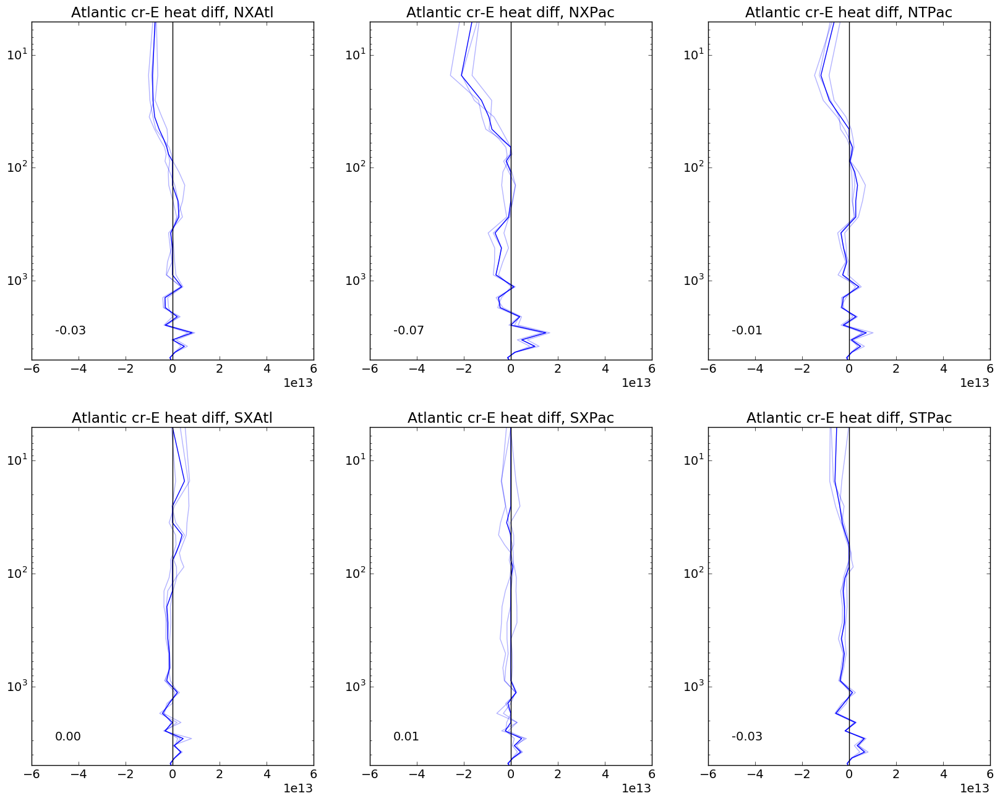

In [50]:
# Plot Atlantic basin heat flux
n=1
cenlon = 180
var1 = 'temp_yflux_adv'
var2 = 'temp_yflux_gm'
var3 = 'temp_yflux_submeso'
var4 = 'temp_yflux_ndiffuse'

vmin= -0.6E14
vmax=0.6E14

const = 1.0

lon1=-65
lon2=25

nrows=1
matplotlib.rcParams['figure.figsize']=(20,nrows *8)
matplotlib.rcParams.update({'font.size':14})
toplotthick = get_eq_thick('ctl')

toplot = (get_eq_tot(oceanEA['ctl']))

toplot = toplot.sel(xt_ocean = slice(lon1,lon2)).sum(dim='xt_ocean')
total = toplot.sum()

plt.plot(toplot.values,toplot.st_ocean.values)
plt.yscale('log')
plt.gca().invert_yaxis()
plt.title('ctl')
plt.plot([0,0],[5000,0],color='k')
plt.ylim(5000,0)
plt.xlim(-0.6E15,0.6E15)
plt.xlabel('')
plt.ylabel('')
plt.text(-3.0E14,3000,str(total.values/1E15))

plt.show()

nrows=3
matplotlib.rcParams['figure.figsize']=(20,nrows *8)
matplotlib.rcParams.update({'font.size':14})

for exp in exps:
    ax = plt.subplot(nrows,3,n); n+=1

    thickctl = get_eq_thick('ctl')
    thickexp = get_eq_thick(exp)
    
    ctlvalues = get_eq_tot(oceanEA['ctl'])
    
    toplot = (get_eq_tot(oceanEA[exp]) - ctlvalues)
    
    thickexp1 = get_eq_thickEM(exp,1)
    thickexp2 = get_eq_thickEM(exp,2)
    thickexp3 = get_eq_thickEM(exp,3)
    EN1 = (get_eqtotEM(ocean[exp][1])  - ctlvalues).sel(xt_ocean = slice(lon1,lon2)).sum(dim='xt_ocean')
    EN2 = (get_eqtotEM(ocean[exp][2])  - ctlvalues).sel(xt_ocean = slice(lon1,lon2)).sum(dim='xt_ocean')
    EN3 = (get_eqtotEM(ocean[exp][3])  - ctlvalues).sel(xt_ocean = slice(lon1,lon2)).sum(dim='xt_ocean')
    
    sign1 = np.sign(EN1)
    sign2 = np.sign(EN2)
    sign3 = np.sign(EN3)

    mask = np.where(sign1 == sign2,1.0,0.0)
    mask = mask * np.where(sign1 == sign3,1.0,0.0)    
    
    toplot = toplot.sel(xt_ocean = slice(lon1,lon2)).sum(dim='xt_ocean')
    
    toplot.values = toplot.values * mask

    total = toplot.sum()
    
    plt.plot(EN1.values,EN1.st_ocean.values,alpha = 0.3,linestyle='-',color='b')
    plt.plot(EN2.values,EN2.st_ocean.values,alpha = 0.3,linestyle='-',color='b')
    plt.plot(EN3.values,EN3.st_ocean.values,alpha = 0.3,linestyle='-',color='b')
    plt.plot(toplot.values,toplot.st_ocean.values)
    plt.yscale('log')    
    plt.gca().invert_yaxis()
    plt.title('Atlantic cr-E heat diff, ' + names[exp])
    plt.plot([0,0],[5000,0],color='k')
    plt.ylim(5000,0)
    plt.xlim(vmin,vmax)
    plt.xlabel('')
    plt.ylabel('')
    plt.text(-5.0E13,3000,"{:02.2f}".format(toplot.sum().values/1E15))

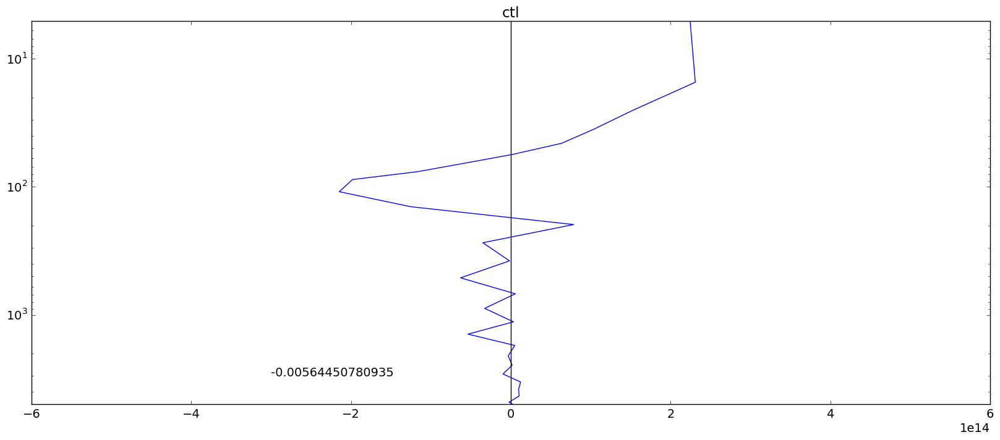

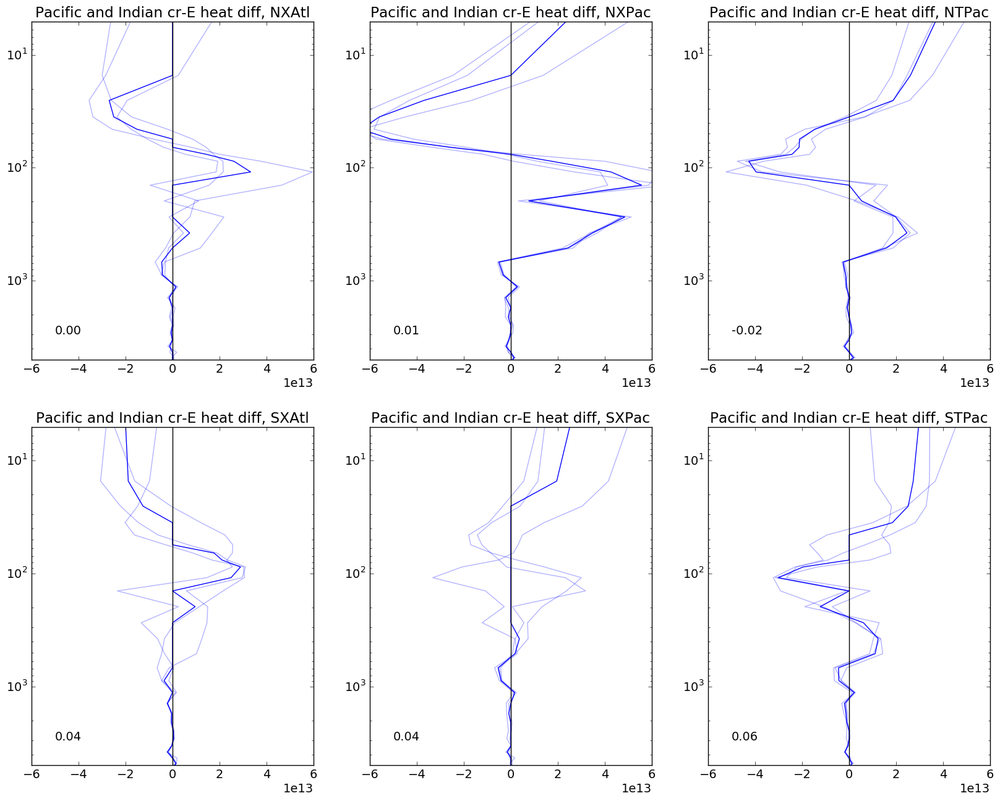

In [51]:
# Plot Pacific and Indian basin heat flux
# By subtracting Atlantic flux
n=1
cenlon = 180
var1 = 'temp_yflux_adv'
var2 = 'temp_yflux_gm'
var3 = 'temp_yflux_submeso'
var4 = 'temp_yflux_ndiffuse'

vmin= -0.6E14
vmax=0.6E14

const = 1.0

lon1=-65
lon2=25

nrows=1
matplotlib.rcParams['figure.figsize']=(20,nrows *8)
matplotlib.rcParams.update({'font.size':14})
toplotthick = get_eq_thick('ctl')

toplot = (get_eq_tot(oceanEA['ctl']))

toplot = toplot.sum(dim='xt_ocean') - toplot.sel(xt_ocean = slice(lon1,lon2)).sum(dim='xt_ocean')
total = toplot.sum()

plt.plot(toplot.values,toplot.st_ocean.values)
plt.yscale('log')
plt.gca().invert_yaxis()
plt.title('ctl')
plt.plot([0,0],[5000,0],color='k')
plt.ylim(5000,0)
plt.xlim(-0.6E15,0.6E15)
plt.xlabel('')
plt.ylabel('')
plt.text(-3.0E14,3000,str(total.values/1E15))

plt.show()

nrows=3
matplotlib.rcParams['figure.figsize']=(20,nrows *8)
matplotlib.rcParams.update({'font.size':14})

for exp in exps:
    ax = plt.subplot(nrows,3,n); n+=1

    thickctl = get_eq_thick('ctl')
    thickexp = get_eq_thick(exp)
    
    ctlvalues = get_eq_tot(oceanEA['ctl'])
    
    toplot = (get_eq_tot(oceanEA[exp]) - ctlvalues)
    
    thickexp1 = get_eq_thickEM(exp,1)
    thickexp2 = get_eq_thickEM(exp,2)
    thickexp3 = get_eq_thickEM(exp,3)
    EN1 = ((get_eqtotEM(ocean[exp][1])  - ctlvalues).sum(dim='xt_ocean') - 
                (get_eqtotEM(ocean[exp][1])  - ctlvalues).sel(xt_ocean = slice(lon1,lon2)).sum(dim='xt_ocean'))
    EN2 = ((get_eqtotEM(ocean[exp][2])  - ctlvalues).sum(dim='xt_ocean') - 
                (get_eqtotEM(ocean[exp][2])  - ctlvalues).sel(xt_ocean = slice(lon1,lon2)).sum(dim='xt_ocean'))
    EN3 = ((get_eqtotEM(ocean[exp][3])  - ctlvalues).sum(dim='xt_ocean') - 
                (get_eqtotEM(ocean[exp][3])  - ctlvalues).sel(xt_ocean = slice(lon1,lon2)).sum(dim='xt_ocean'))
       
    sign1 = np.sign(EN1)
    sign2 = np.sign(EN2)
    sign3 = np.sign(EN3)

    mask = np.where(sign1 == sign2,1.0,0.0)
    mask = mask * np.where(sign1 == sign3,1.0,0.0)    
    
    toplot = toplot.sum(dim='xt_ocean') - toplot.sel(xt_ocean = slice(lon1,lon2)).sum(dim='xt_ocean')
    
    toplot.values = toplot.values * mask

    total = toplot.sum()
    
    plt.plot(EN1.values,EN1.st_ocean.values,alpha = 0.3,linestyle='-',color='b')
    plt.plot(EN2.values,EN2.st_ocean.values,alpha = 0.3,linestyle='-',color='b')
    plt.plot(EN3.values,EN3.st_ocean.values,alpha = 0.3,linestyle='-',color='b')
    plt.plot(toplot.values,toplot.st_ocean.values)
    plt.yscale('log')    
    plt.gca().invert_yaxis()
    plt.title('Pacific and Indian cr-E heat diff, ' + names[exp])
    plt.plot([0,0],[5000,0],color='k')
    plt.ylim(5000,0)
    plt.xlim(vmin,vmax)
    plt.xlabel('')
    plt.ylabel('')
    plt.text(-5.0E13,3000,"{:02.2f}".format(toplot.sum().values/1E15))

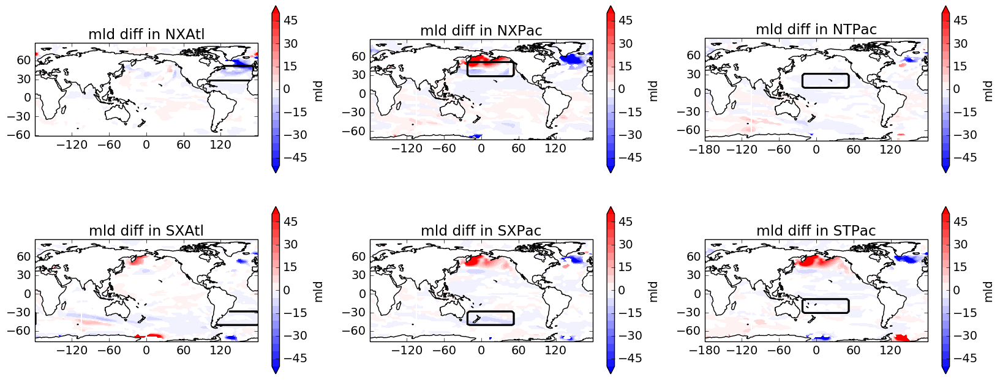

In [102]:
# Plot mixed layer depth
nrows=3
matplotlib.rcParams['figure.figsize']=(20,nrows *4)
matplotlib.rcParams.update({'font.size':14})

n=1
cenlon = 180
var = 'mld'
vmin = -50; vmax = 50
const = 1.0

for exp in exps:
    ax = plt.subplot(nrows,3,n,projection=ccrs.PlateCarree(central_longitude=cenlon)); n+=1
    drawmap_sub(ax)
    toplot = const * (oceanEA[exp][var] - oceanEA['ctl'][var].values )
    sign1 = np.sign(ocean[exp][1][var] - oceanEA['ctl'][var].values) 
    sign2 = np.sign(ocean[exp][2][var] - oceanEA['ctl'][var].values)
    sign3 = np.sign(ocean[exp][3][var] - oceanEA['ctl'][var].values)

    mask = np.where(sign1 == sign2,1.0,np.nan)
    mask = mask * np.where(sign1 == sign3,1.0,np.nan)
    toplot.values = toplot.values * mask
    
    toplot.plot.contourf(vmin=vmin,vmax=vmax,levels=21,cmap='bwr',extend='both',transform = ccrs.PlateCarree())
    if exp != 'SPac_flux_2':
        plot_box(exp)
    
    plt.title(var + ' diff in ' + names[exp])
    plt.xlabel('')
    plt.ylabel('')

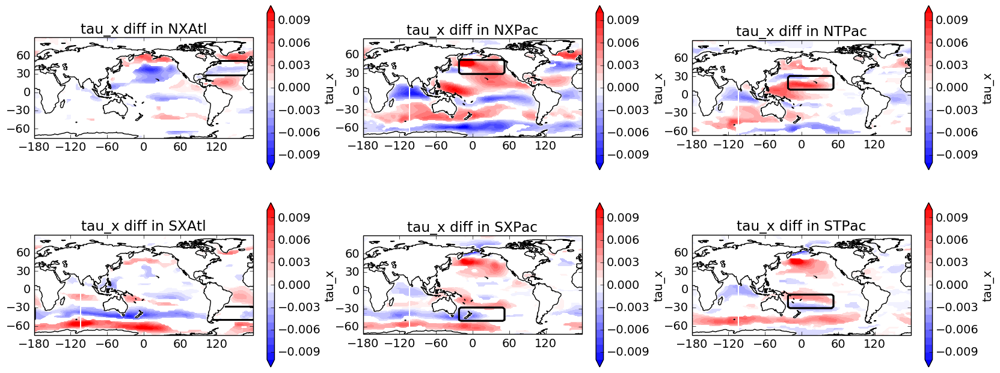

In [103]:
# Plot tau_x
nrows=3
matplotlib.rcParams['figure.figsize']=(20,nrows *4)
matplotlib.rcParams.update({'font.size':14})

n=1
cenlon = 180
var = 'tau_x'
vmin = -1E-2; vmax = 1E-2
const = 1.0

for exp in exps:
    ax = plt.subplot(nrows,3,n,projection=ccrs.PlateCarree(central_longitude=cenlon)); n+=1
    drawmap_sub(ax)
    toplot = const * (oceanEA[exp][var] - oceanEA['ctl'][var].values )
    sign1 = np.sign(ocean[exp][1][var] - oceanEA['ctl'][var].values) 
    sign2 = np.sign(ocean[exp][2][var] - oceanEA['ctl'][var].values)
    sign3 = np.sign(ocean[exp][3][var] - oceanEA['ctl'][var].values)

    mask = np.where(sign1 == sign2,1.0,np.nan)
    mask = mask * np.where(sign1 == sign3,1.0,np.nan)
    toplot.values = toplot.values * mask
    
    toplot.plot.contourf(vmin=vmin,vmax=vmax,levels=21,cmap='bwr',extend='both',transform = ccrs.PlateCarree())
    if exp != 'SPac_flux_2':
        plot_box(exp)
    
    plt.title(var + ' diff in ' + names[exp])
    plt.xlabel('')
    plt.ylabel('')

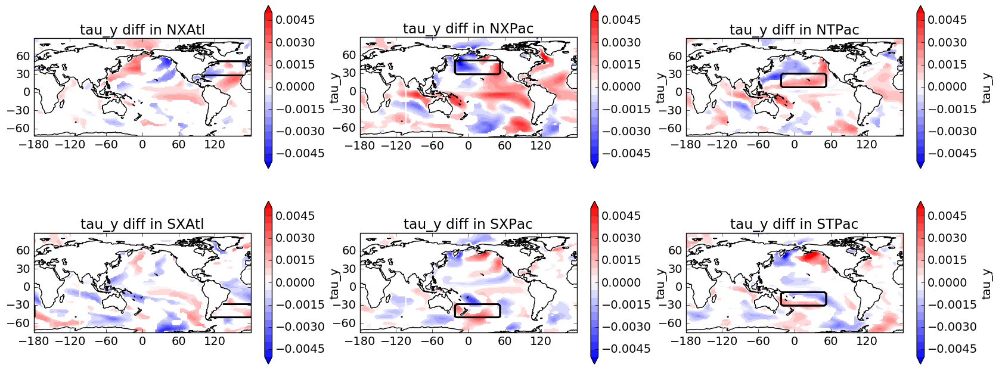

In [104]:
# Plot tau_y
nrows=3
matplotlib.rcParams['figure.figsize']=(20,nrows *4)
matplotlib.rcParams.update({'font.size':14})

n=1
cenlon = 180
var = 'tau_y'
vmin = -5E-3; vmax = 5E-3
const = 1.0

for exp in exps:
    ax = plt.subplot(nrows,3,n,projection=ccrs.PlateCarree(central_longitude=cenlon)); n+=1
    drawmap_sub(ax)
    toplot = const * (oceanEA[exp][var] - oceanEA['ctl'][var].values )
    sign1 = np.sign(ocean[exp][1][var] - oceanEA['ctl'][var].values) 
    sign2 = np.sign(ocean[exp][2][var] - oceanEA['ctl'][var].values)
    sign3 = np.sign(ocean[exp][3][var] - oceanEA['ctl'][var].values)

    mask = np.where(sign1 == sign2,1.0,np.nan)
    mask = mask * np.where(sign1 == sign3,1.0,np.nan)
    toplot.values = toplot.values * mask
    
    toplot.plot.contourf(vmin=vmin,vmax=vmax,levels=21,cmap='bwr',extend='both',transform = ccrs.PlateCarree())
    if exp != 'SPac_flux_2':
        plot_box(exp)
    
    plt.title(var + ' diff in ' + names[exp])
    plt.xlabel('')
    plt.ylabel('')

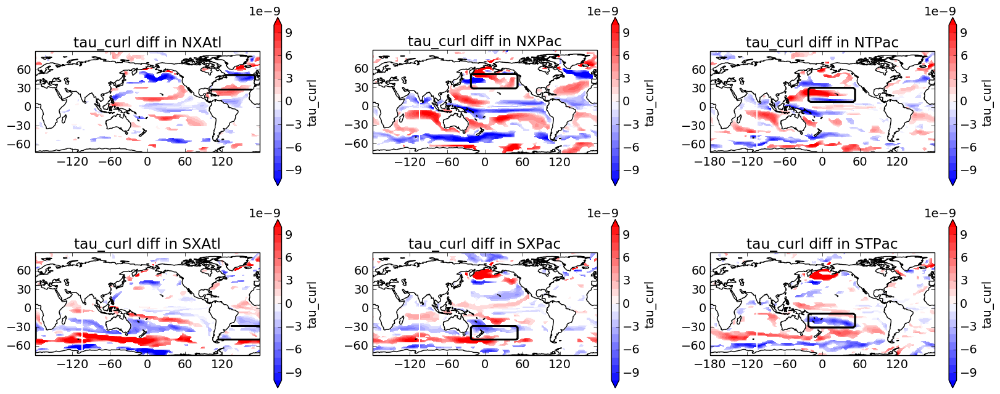

In [105]:
# Plot curl_tau
nrows=3
matplotlib.rcParams['figure.figsize']=(20,nrows *4)
matplotlib.rcParams.update({'font.size':14})

n=1
cenlon = 180
var = 'tau_curl'
vmin = -1E-8; vmax = 1E-8
const = 1.0

for exp in exps:
    ax = plt.subplot(nrows,3,n,projection=ccrs.PlateCarree(central_longitude=cenlon)); n+=1
    drawmap_sub(ax)
    toplot = const * (oceanEA[exp][var] - oceanEA['ctl'][var].values )
    sign1 = np.sign(ocean[exp][1][var] - oceanEA['ctl'][var].values) 
    sign2 = np.sign(ocean[exp][2][var] - oceanEA['ctl'][var].values)
    sign3 = np.sign(ocean[exp][3][var] - oceanEA['ctl'][var].values)

    mask = np.where(sign1 == sign2,1.0,np.nan)
    mask = mask * np.where(sign1 == sign3,1.0,np.nan)
    toplot.values = toplot.values * mask
    
    toplot.plot.contourf(vmin=vmin,vmax=vmax,levels=21,cmap='bwr',extend='both',transform = ccrs.PlateCarree())
    if exp != 'SPac_flux_2':
        plot_box(exp)
    
    plt.title(var + ' diff in ' + names[exp])
    plt.xlabel('')
    plt.ylabel('')

### Inferred Atmospheric heat transport

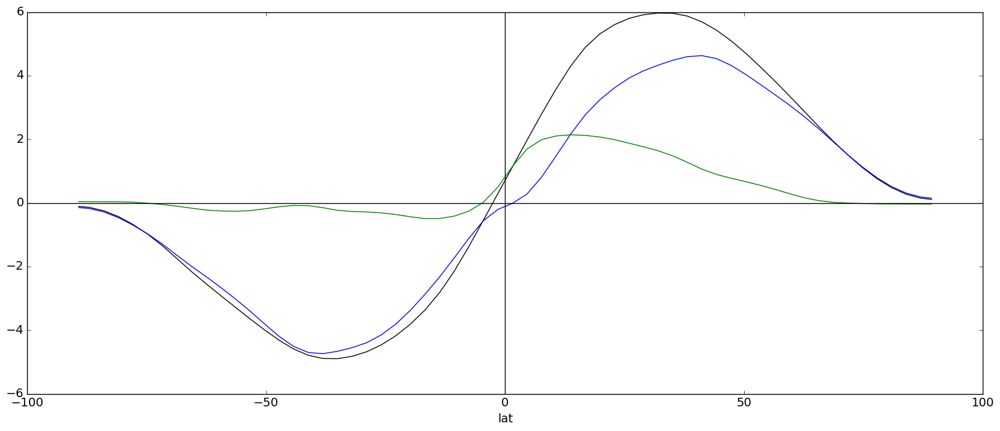

In [157]:
# Plot meridional heat transport and ocean-atmos split
matplotlib.rcParams['figure.figsize']=(20,8)
matplotlib.rcParams.update({'font.size':14})

HT_total['ctl'].mean(dim='lon').plot(color='k')
HT_atm['ctl'].mean(dim='lon').plot(color='b')
HT_ocn['ctl'].mean(dim='lon').plot(color='g')
plt.axhline(0, color='k')
plt.axvline(0, color='k') 